# <font color= red>Project Background </font>

### Introduction
- We are tasked to conduct data exploration and/or data pre-processing of the CIFAR-10 dataset. 


### Baseline
- Create a baseline model using Multilayer Perceptron (MLP) or LeNet-5 Convolutional Neural network Architecture.

### Complex model building + Hyper Parameter tuning 
- We are requiree dto tune the hyper parameters of the models to improve the performance 

### Evaluation of model 
- Analyse and evaluate your models 
- Once done, choose the best performing model and deploy

### Deploy it to an android application 
- Deploy model into android application

# <font color= maroon>Imports needed

In [3]:
import keras
# from tensorflow.keras import layers
import scipy
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D, AveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.utils import to_categorical

from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dropout, LeakyReLU

from keras import callbacks
from keras.datasets import mnist
from tensorflow.keras.optimizers import RMSprop, SGD
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from keras.callbacks import ModelCheckpoint, EarlyStopping




%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('ggplot')

print(tf.reduce_sum(tf.random.normal([1000, 1000])))
print(tf.config.list_physical_devices('GPU'))

tf.Tensor(-790.0327, shape=(), dtype=float32)
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# <font color= maroon>Data Exploration

### Extracting data file/import

Things to note
- The Cifar10 dataset contains coloured images with three colour images (red, green, blue) hence the need to flatten.
- Original size of images in the cifar 10 datasets are 32 by 32 pixles with three colour images. Aka is in three dimensional array. 

In [2]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


In [3]:
print (np.max(x_train))
print (np.min(x_train))

255
0


In [4]:
print(y_test)

[[3]
 [8]
 [8]
 ...
 [5]
 [1]
 [7]]


### <font color=purple>Detecting Outliers in the cifar 10 dataset</font>

### <font color=red>Z-Score method

In [15]:
import numpy as np
import pandas as pd
from scipy import stats
from keras.datasets import cifar10

# Load CIFAR-10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Reshape images to 1D array
X_train_flat = X_train.reshape(X_train.shape[0], -1)

# Calculate z-score for each feature
z_scores = np.abs(stats.zscore(X_train_flat))

# Find data points with z-score > 3
outliers = np.where(z_scores > 3)

# Print number of outliers
print("Number of outliers:", len(outliers[0]))


Number of outliers: 0


### <font color=purple> Exploring the number of occurences of the cifar 10 dataset</font>
- Each clascs of the cifar10 datset contains 5000 images for each category, hence the equal distribution of images within the y_train set. This means the keras cifar-10 dataset is balanced. 

In [5]:
import numpy as np

unique, counts = np.unique(y_train, return_counts=True)
print(np.asarray((unique, counts)).T)

[[   0 5000]
 [   1 5000]
 [   2 5000]
 [   3 5000]
 [   4 5000]
 [   5 5000]
 [   6 5000]
 [   7 5000]
 [   8 5000]
 [   9 5000]]


### <font color=purple>Visualising the dataset</font>

C:\Users\mctro\AppData\Local\Temp\ipykernel_8500\3611457444.py:28: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


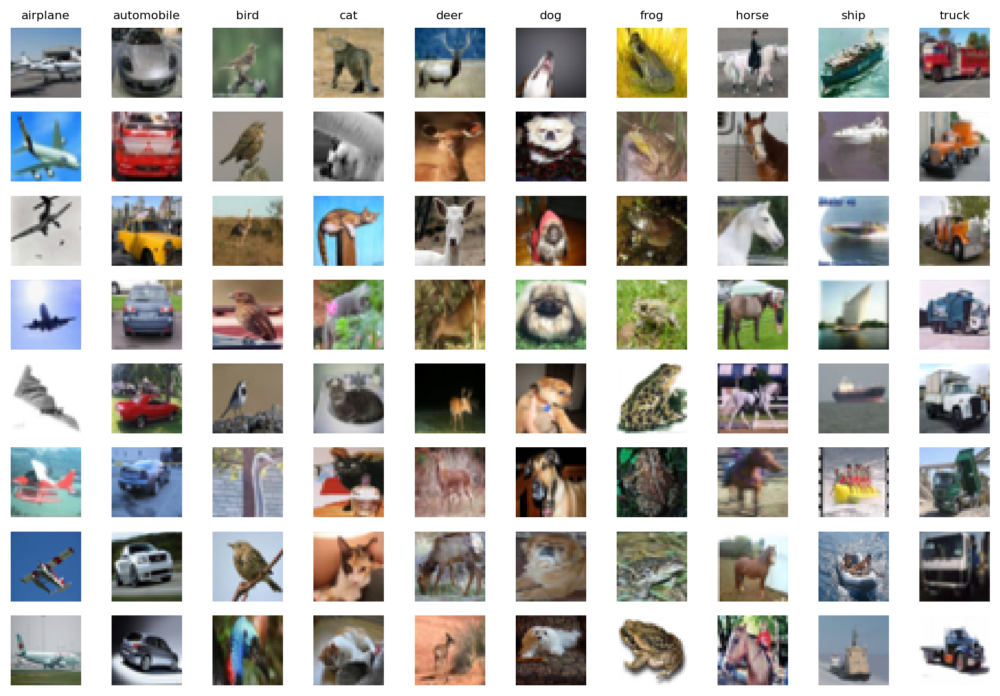

In [6]:
# # Define class names
# class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
#                'dog', 'frog', 'horse', 'ship', 'truck']

# # Display some random images
# fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(10,6))
# for i, ax in enumerate(axes.flat):
#     idx = np.random.randint(len(x_train))
#     ax.imshow(x_train[idx])
#     ax.set_title(class_names[int(y_train[idx])])
#     ax.axis('off')
# plt.show()




# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# display some random images
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == y_train)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(x_train[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name,fontsize=8)



### <font color=purple>Principal component analysis</font>
- The plot below shows a scatterplot where each dot represents an image and its colour indicating its class label. We are able to see hwether there is any specific distribution in the datset.

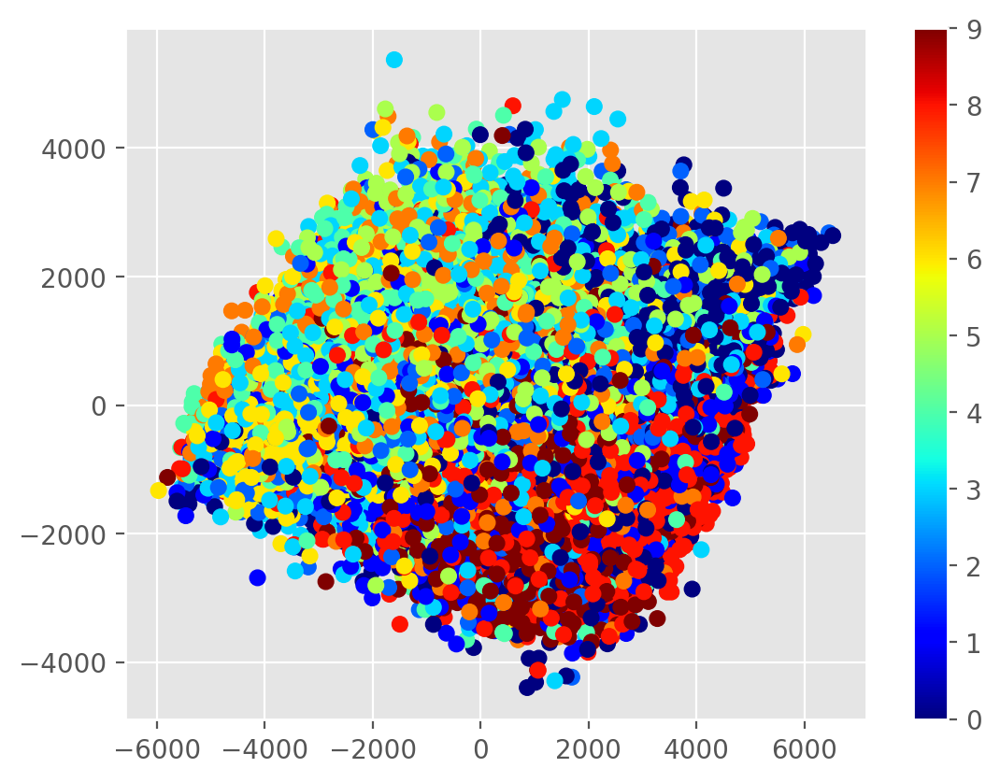

In [7]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
x_train_pca = pca.fit_transform(x_train.reshape(-1, 32*32*3))
plt.scatter(x_train_pca[:, 0], x_train_pca[:, 1], c=y_train.reshape(-1), cmap='jet')
plt.colorbar()
plt.show()

### <font color=purple>visualising each class distribution</font> 
- From the dataset, we are able to see that there are an equal distribution of images in the entire dataset.

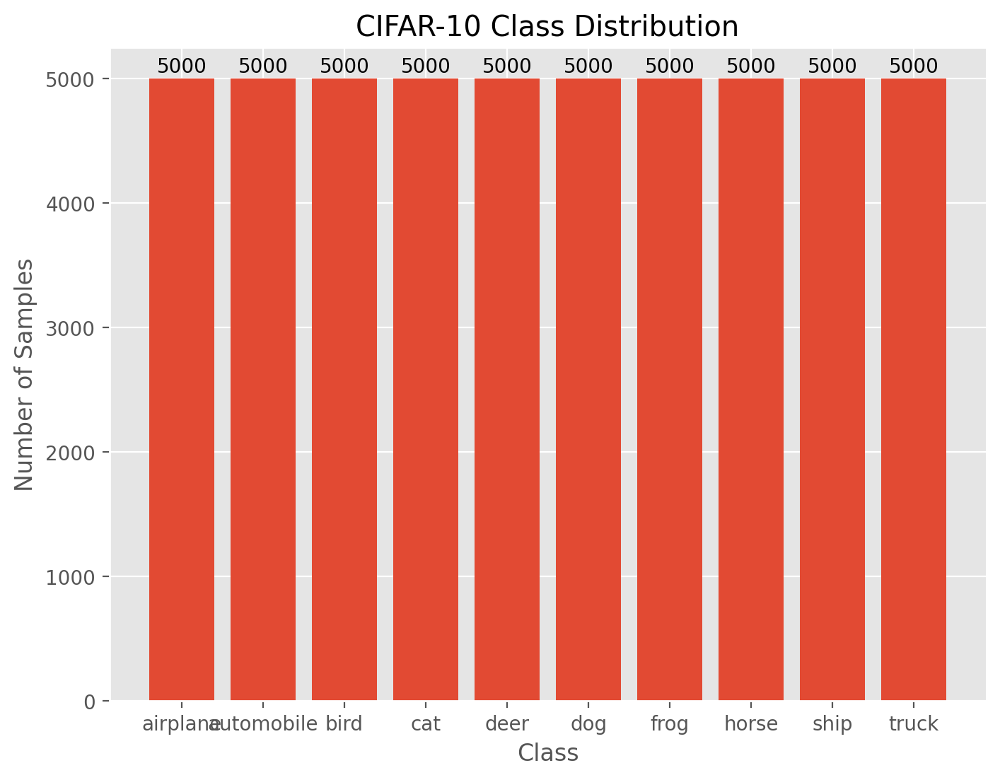

In [8]:
# determining number of samples per class
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
class_counts = np.zeros(len(class_names))
for y in y_train:
    class_counts[y[0]] += 1
    
# plot the chart distribution of each class
plt.figure(figsize=(8, 6))
barplot = plt.bar(class_names, class_counts)
plt.title('CIFAR-10 Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Samples')

# Add the sample counts to each bar
for i, count in enumerate(class_counts):
    plt.text(i, count + 50, str(int(count)), ha='center', fontsize=10)

plt.show()


### <font color=purple>Visualising distribution of Pixles in Cifar10</font>
- The pixle values of an image represent the intensity of light in each pixle. Each pixle has a value between 0 and 255 where 0 has no colour at all (black) and 255 means that maximum intensity of the colour (white).
- The pixle values are stored as unsigned 8 but integers (unit8). 

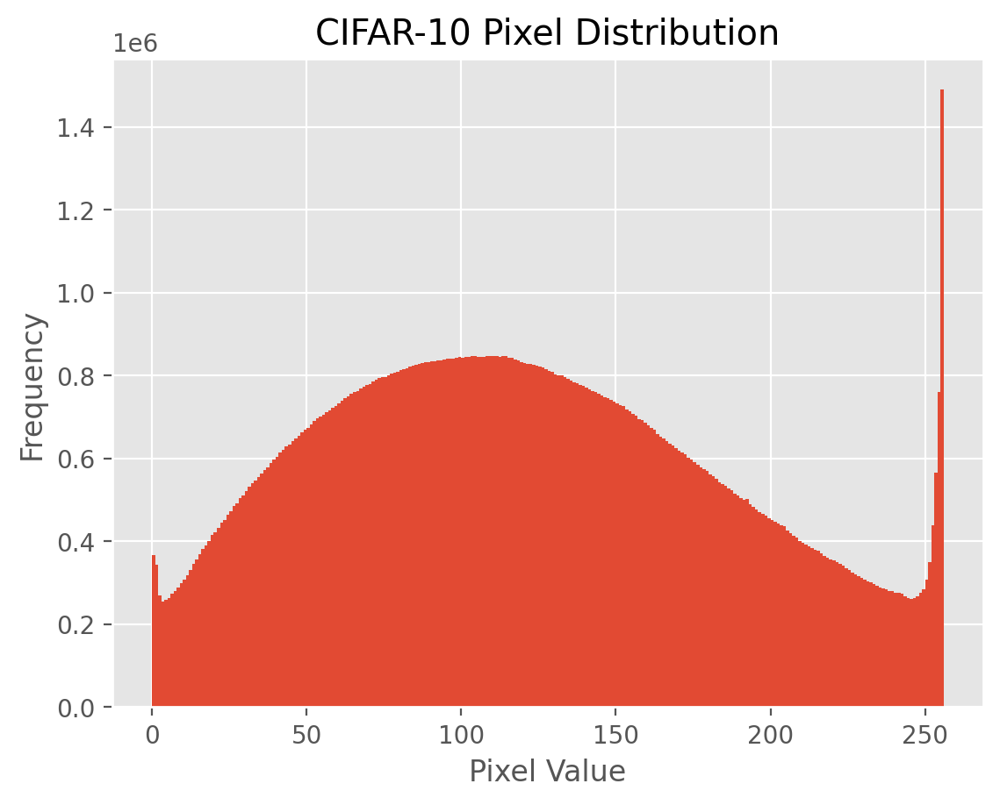

In [9]:
import numpy as np
from keras.datasets import cifar10
import matplotlib.pyplot as plt

(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Flatten the images to 1D arrays
x_train_flat = x_train.reshape((x_train.shape[0], -1))

# Plot the histogram of pixel values
plt.hist(x_train_flat.ravel(), bins=256, range=(0, 256))
plt.title('CIFAR-10 Pixel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

# <font color= maroon> Model Building (Baseline) - MLP

### Import

In [10]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

- There is no need to reshape the data as the data is already in the correct shape for training a CNN. However, to build a Multilayer perceptron, there is a need to convert the data into a one dimensional array before feeding it into the network.

### Considerations for preprocessing 

<b>One hot encoding</b>  
- One hot encoding can be used to encode our categorical y_train and y_test, however, if one hot encoding is used, we are unable to use the <b>sparse_categorical_crossentropy</b> as our loss function. Sparse_categorical_crossentropy is used only for multi-class classification where the output label is assigned as an integer value. If y_train and y_test sets are one hot encoded, we are not able to use Sparse_categorical_crossentropy as they are no longer iteger values.  

In [11]:
# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255

# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
<b>Flattening before running through neural network</b>
- Most neural networks only accepts a 1D vector not a 3D vector. It is designed for image classification and takes inputs in the form of 1 dimensional arrays. 
- The cifar-10 dataset contains images of size 32x32x3 pixles where each image represents a 3D tensor with dimensions (height, width, channels), where channels represent red, green and blue for colour. 

<b>Optimisers used </b>
- RMS Prop (RMS) Deep learning. 
- Adam Deep Learning Optimiser

In [12]:
# build mlp model 
model = Sequential(name='MLP_Baseline')
model.add(Flatten(input_shape=(32, 32, 3))) # input shape flattened to one dimensional, 32x32x3 = 3072, input_shape=3072

model.add(Dense(128, activation='relu'))

model.add(Dense(64, activation='relu'))

model.add(Dense(10, activation='softmax'))

model.summary()

# loss function set as categorical_crossentropy optimiser = RMSprop()
model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(), #'rmsprop'
              metrics=['accuracy'])


# model_log = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_data=(x_test, (y_test)))
model_log = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)





Model: "MLP_Baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 128)               393344    
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 10)                650       
                                                                 
Total params: 402,250
Trainable params: 402,250
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
1407/1407 [==============================] - 7s 4ms/step - loss: 1.9409 - accuracy: 0.3011 - val_loss: 1.8616 - val_accuracy: 0.3346
Epoch 2/10
1407/1407 [==============

In [13]:
# score = model_.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 2ms/step - loss: 1.6171 - accuracy: 0.4384
Test loss:  1.6170952320098877
Test accuracy: 0.438400000333786


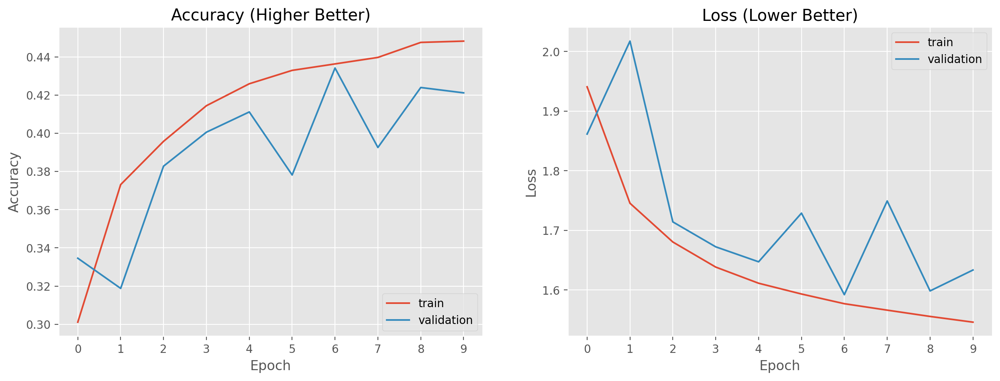

In [14]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [15]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 1ms/step
[0 9 8 ... 5 5 7]


In [16]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [17]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [18]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_8500\3068442997.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


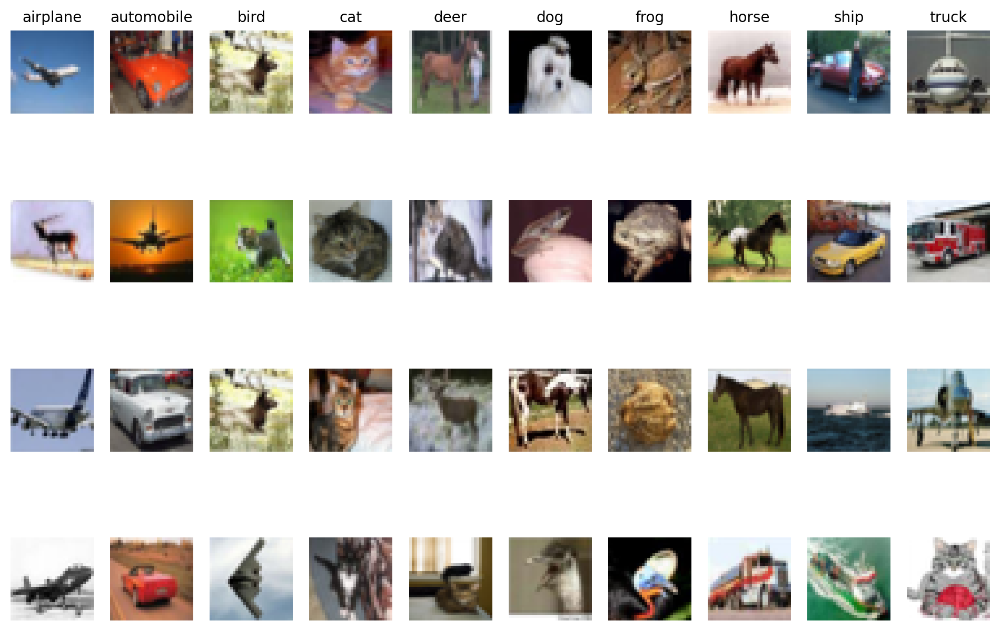

In [19]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 1) - MLP

### Import

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [3]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer 
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting 

In [4]:
model = Sequential(name='MLP_Tuned_1')
model.add(Flatten(input_shape=(32, 32, 3)))

model.add(Dense(2048, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.4))

model.add(Dense(512, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])


model.compile(loss='categorical_crossentropy', 
             tf.keras.optimizers.Adam(lr=0.0001),
             metrics=['accuracy'])


model_log = model.fit(x_train, y_train, epochs=100, batch_size=32, validation_split=0.1)




Model: "MLP_Tuned_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 2048)              6293504   
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 1024)              2098176   
                                                                 
 dropout_1 (Dropout)         (None, 1024)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               524800    
                                                                 
 dropout_2 (Dropout)         (None, 512)               

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/100
1407/1407 [==============================] - 11s 6ms/step - loss: 2.0400 - accuracy: 0.2503 - val_loss: 1.7882 - val_accuracy: 0.3708
Epoch 2/100
1407/1407 [==============================] - 8s 6ms/step - loss: 1.8371 - accuracy: 0.3433 - val_loss: 1.6702 - val_accuracy: 0.4138
Epoch 3/100
1407/1407 [==============================] - 8s 6ms/step - loss: 1.7449 - accuracy: 0.3818 - val_loss: 1.6049 - val_accuracy: 0.4450
Epoch 4/100
1407/1407 [==============================] - 8s 5ms/step - loss: 1.6767 - accuracy: 0.4106 - val_loss: 1.5550 - val_accuracy: 0.4552
Epoch 5/100
1407/1407 [==============================] - 8s 6ms/step - loss: 1.6286 - accuracy: 0.4243 - val_loss: 1.5366 - val_accuracy: 0.4698
Epoch 6/100
1407/1407 [==============================] - 8s 6ms/step - loss: 1.5883 - accuracy: 0.4449 - val_loss: 1.4931 - val_accuracy: 0.4886
Epoch 7/100
1407/1407 [==============================] - 8s 5ms/step - loss: 1.5518 - accuracy: 0.4563 - val_loss: 1.4790 - val_a

In [5]:
# score = model_.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.4618 - accuracy: 0.5877
Test loss:  1.4617635011672974
Test accuracy: 0.5877000093460083


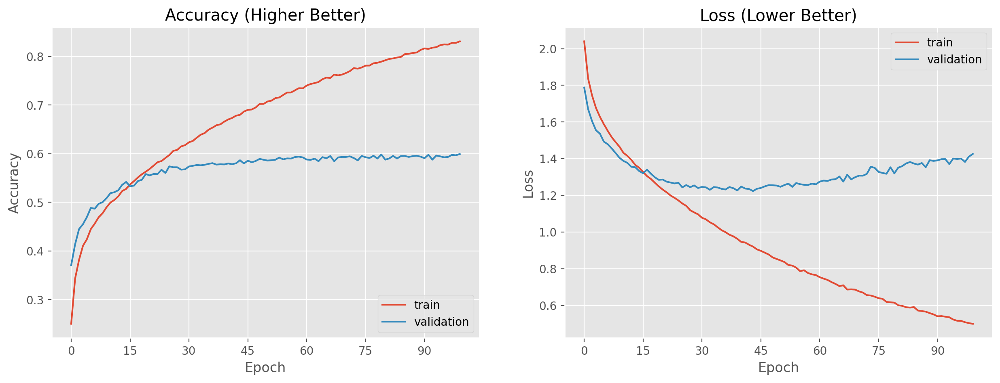

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [7]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 0 ... 3 2 7]


In [8]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_33884\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


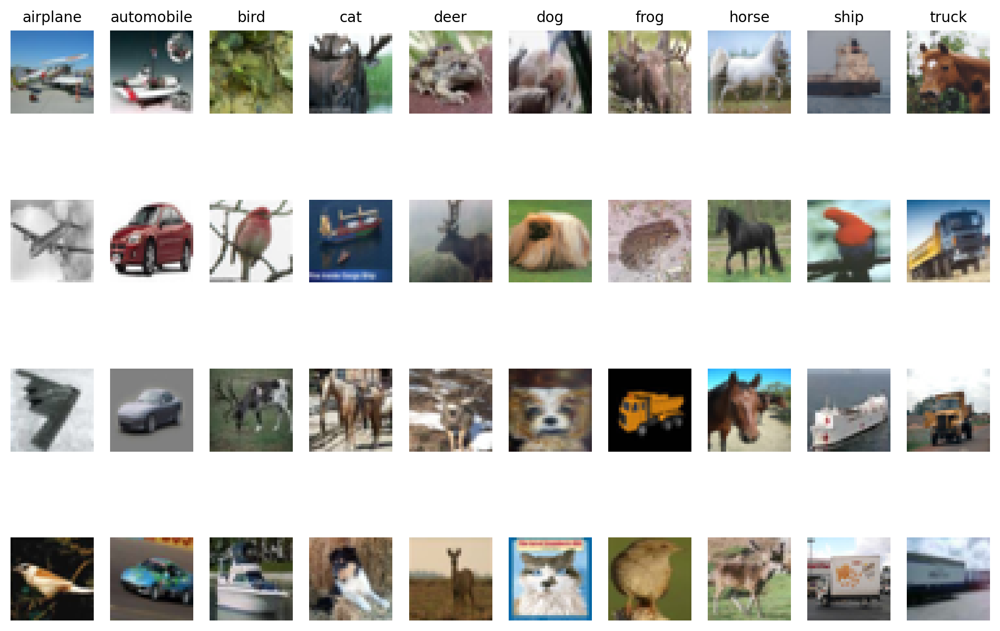

In [11]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 2) - MLP

### Import

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [3]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001

In [4]:
model = Sequential(name='MLP_Tuned_2')
model.add(Flatten(input_shape=(32, 32, 3)))

model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.4))

model.add(Dense(512, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1)




Model: "MLP_Tuned_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/100
176/176 [==============================] - 3s 9ms/step - loss: 2.0978 - accuracy: 0.2342 - val_loss: 1.8381 - val_accuracy: 0.3530
Epoch 2/100
176/176 [==============================] - 1s 7ms/step - loss: 1.8771 - accuracy: 0.3277 - val_loss: 1.6986 - val_accuracy: 0.4044
Epoch 3/100
176/176 [==============================] - 1s 7ms/step - loss: 1.7773 - accuracy: 0.3684 - val_loss: 1.6197 - val_accuracy: 0.4314
Epoch 4/100
176/176 [==============================] - 1s 8ms/step - loss: 1.7067 - accuracy: 0.3982 - val_loss: 1.5704 - val_accuracy: 0.4512
Epoch 5/100
176/176 [==============================] - 1s 8ms/step - loss: 1.6564 - accuracy: 0.4153 - val_loss: 1.5303 - val_accuracy: 0.4678
Epoch 6/100
176/176 [==============================] - 1s 8ms/step - loss: 1.6159 - accuracy: 0.4290 - val_loss: 1.4994 - val_accuracy: 0.4748
Epoch 7/100
176/176 [==============================] - 1s 7ms/step - loss: 1.5763 - accuracy: 0.4451 - val_loss: 1.4728 - val_accuracy: 0.4810

Epoch 58/100
176/176 [==============================] - 3s 17ms/step - loss: 0.8189 - accuracy: 0.7175 - val_loss: 1.2508 - val_accuracy: 0.5780
Epoch 59/100
176/176 [==============================] - 3s 17ms/step - loss: 0.8094 - accuracy: 0.7189 - val_loss: 1.2342 - val_accuracy: 0.5856
Epoch 60/100
176/176 [==============================] - 3s 18ms/step - loss: 0.7940 - accuracy: 0.7255 - val_loss: 1.2367 - val_accuracy: 0.5826
Epoch 61/100
176/176 [==============================] - 3s 17ms/step - loss: 0.7886 - accuracy: 0.7254 - val_loss: 1.2485 - val_accuracy: 0.5838
Epoch 62/100
176/176 [==============================] - 3s 17ms/step - loss: 0.7877 - accuracy: 0.7279 - val_loss: 1.2314 - val_accuracy: 0.5880
Epoch 63/100
176/176 [==============================] - 3s 18ms/step - loss: 0.7697 - accuracy: 0.7335 - val_loss: 1.2566 - val_accuracy: 0.5784
Epoch 64/100
176/176 [==============================] - 3s 17ms/step - loss: 0.7702 - accuracy: 0.7353 - val_loss: 1.2406 - val_ac

In [5]:
# score = model_.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 4s 12ms/step - loss: 1.4048 - accuracy: 0.5773
Test loss:  1.4047613143920898
Test accuracy: 0.5773000121116638


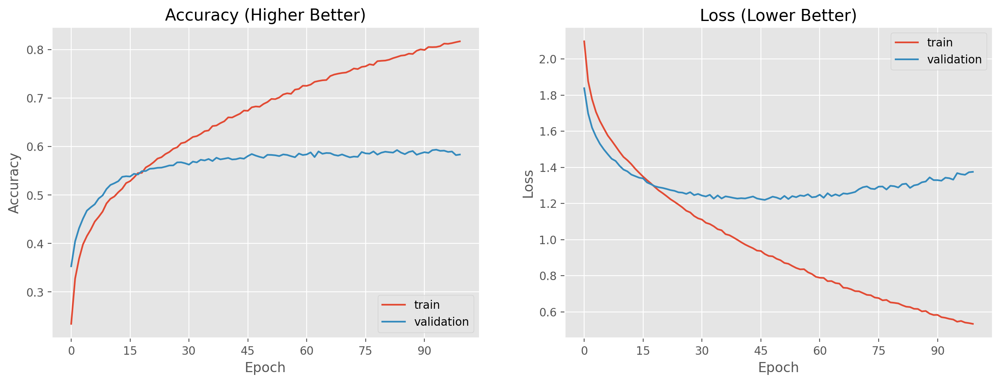

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [7]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 2s 6ms/step
[3 8 0 ... 2 6 7]


In [8]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_10356\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


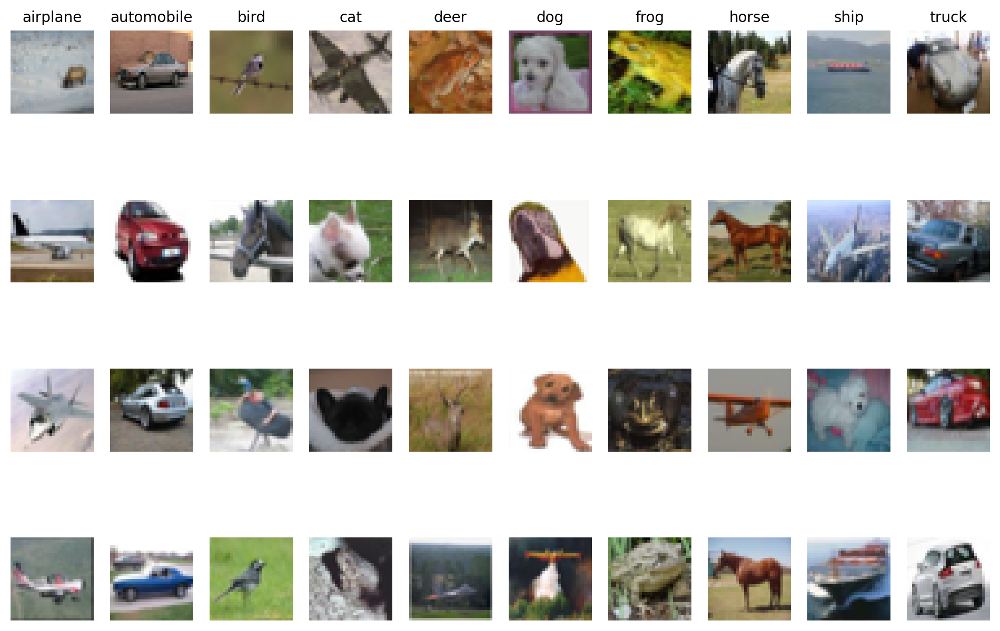

In [11]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 4) - MLP

### Import

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [3]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001

In [4]:
model = Sequential(name='MLP_Tuned_4_fixing_overfitting')
model.add(Flatten(input_shape=(32, 32, 3)))

model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.4))

model.add(Dense(512, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1)




Model: "MLP_Tuned_4_fixing_overfitting"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/100
176/176 [==============================] - 3s 9ms/step - loss: 2.0766 - accuracy: 0.2368 - val_loss: 1.8099 - val_accuracy: 0.3586
Epoch 2/100
176/176 [==============================] - 1s 7ms/step - loss: 1.8561 - accuracy: 0.3318 - val_loss: 1.6910 - val_accuracy: 0.4014
Epoch 3/100
176/176 [==============================] - 1s 6ms/step - loss: 1.7713 - accuracy: 0.3694 - val_loss: 1.6257 - val_accuracy: 0.4344
Epoch 4/100
176/176 [==============================] - 1s 6ms/step - loss: 1.7078 - accuracy: 0.3942 - val_loss: 1.5736 - val_accuracy: 0.4560
Epoch 5/100
176/176 [==============================] - 1s 7ms/step - loss: 1.6580 - accuracy: 0.4135 - val_loss: 1.5296 - val_accuracy: 0.4696
Epoch 6/100
176/176 [==============================] - 1s 7ms/step - loss: 1.6104 - accuracy: 0.4318 - val_loss: 1.4965 - val_accuracy: 0.4818
Epoch 7/100
176/176 [==============================] - 1s 7ms/step - loss: 1.5792 - accuracy: 0.4448 - val_loss: 1.4670 - val_accuracy: 0.4924

Epoch 58/100
176/176 [==============================] - 1s 6ms/step - loss: 0.8175 - accuracy: 0.7183 - val_loss: 1.2277 - val_accuracy: 0.5918
Epoch 59/100
176/176 [==============================] - 1s 6ms/step - loss: 0.8190 - accuracy: 0.7158 - val_loss: 1.2384 - val_accuracy: 0.5880
Epoch 60/100
176/176 [==============================] - 1s 7ms/step - loss: 0.8043 - accuracy: 0.7202 - val_loss: 1.2411 - val_accuracy: 0.5892
Epoch 61/100
176/176 [==============================] - 1s 7ms/step - loss: 0.7946 - accuracy: 0.7261 - val_loss: 1.2389 - val_accuracy: 0.5862
Epoch 62/100
176/176 [==============================] - 1s 7ms/step - loss: 0.7832 - accuracy: 0.7280 - val_loss: 1.2371 - val_accuracy: 0.5870
Epoch 63/100
176/176 [==============================] - 1s 7ms/step - loss: 0.7793 - accuracy: 0.7302 - val_loss: 1.2379 - val_accuracy: 0.5870
Epoch 64/100
176/176 [==============================] - 1s 6ms/step - loss: 0.7716 - accuracy: 0.7324 - val_loss: 1.2417 - val_accuracy:

In [5]:
# score = model_.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.3894 - accuracy: 0.5846
Test loss:  1.3894497156143188
Test accuracy: 0.5845999717712402


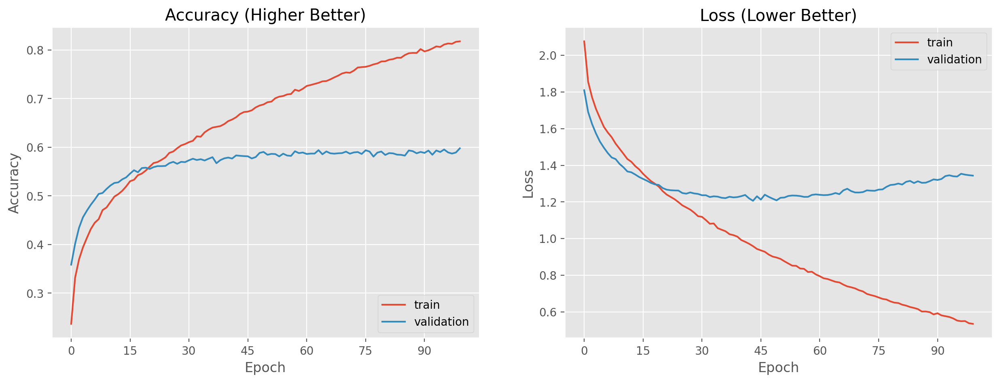

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [7]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 0 ... 3 4 7]


In [8]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_30592\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


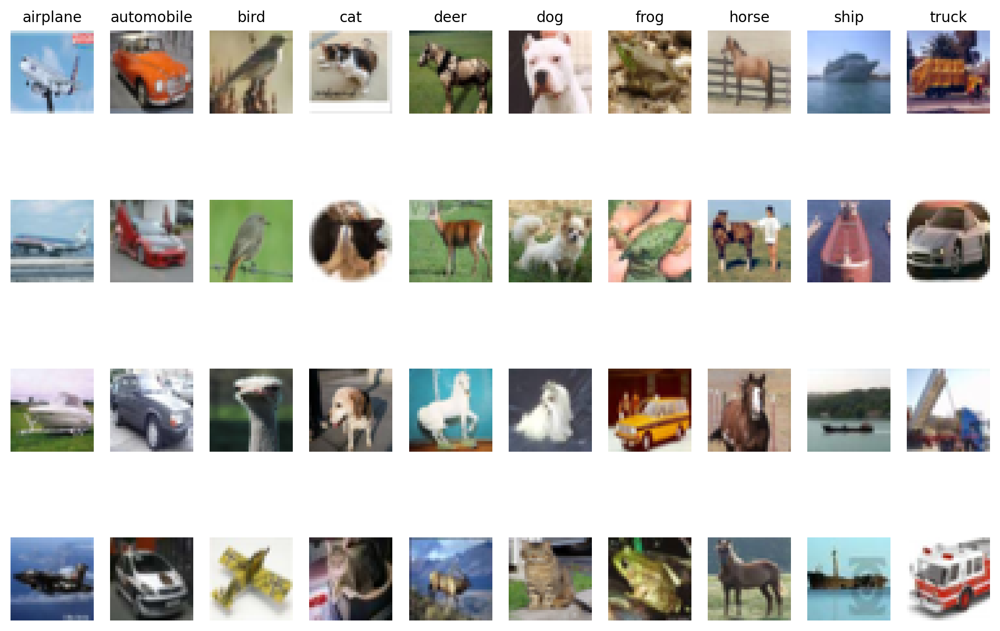

In [11]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 4 - fixing overfitting) - MLP

### Import

In [12]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [13]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001

In [14]:
model = Sequential(name='MLP_Tuned_4')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.6))

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1)




Model: "MLP_Tuned_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 3072)              0         
                                                                 
 dense_6 (Dense)             (None, 1024)              3146752   
                                                                 
 dropout_5 (Dropout)         (None, 1024)              0         
                                                                 
 dense_7 (Dense)             (None, 512)               524800    
                                                                 
 dropout_6 (Dropout)         (None, 512)               0         
                                                                 
 dense_8 (Dense)             (None, 256)               131328    
                                                                 
 dropout_7 (Dropout)         (None, 256)               

Epoch 44/100
176/176 [==============================] - 1s 6ms/step - loss: 1.5160 - accuracy: 0.5826 - val_loss: 1.5495 - val_accuracy: 0.5730
Epoch 45/100
176/176 [==============================] - 1s 6ms/step - loss: 1.5038 - accuracy: 0.5876 - val_loss: 1.5477 - val_accuracy: 0.5742
Epoch 46/100
176/176 [==============================] - 1s 6ms/step - loss: 1.4964 - accuracy: 0.5888 - val_loss: 1.5389 - val_accuracy: 0.5728
Epoch 47/100
176/176 [==============================] - 1s 7ms/step - loss: 1.4855 - accuracy: 0.5908 - val_loss: 1.5235 - val_accuracy: 0.5736
Epoch 48/100
176/176 [==============================] - 1s 6ms/step - loss: 1.4751 - accuracy: 0.5950 - val_loss: 1.5319 - val_accuracy: 0.5742
Epoch 49/100
176/176 [==============================] - 1s 7ms/step - loss: 1.4645 - accuracy: 0.5969 - val_loss: 1.5095 - val_accuracy: 0.5734
Epoch 50/100
176/176 [==============================] - 1s 6ms/step - loss: 1.4586 - accuracy: 0.5969 - val_loss: 1.5208 - val_accuracy:

In [15]:
# score = model_.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.5039 - accuracy: 0.5793
Test loss:  1.5039393901824951
Test accuracy: 0.5792999863624573


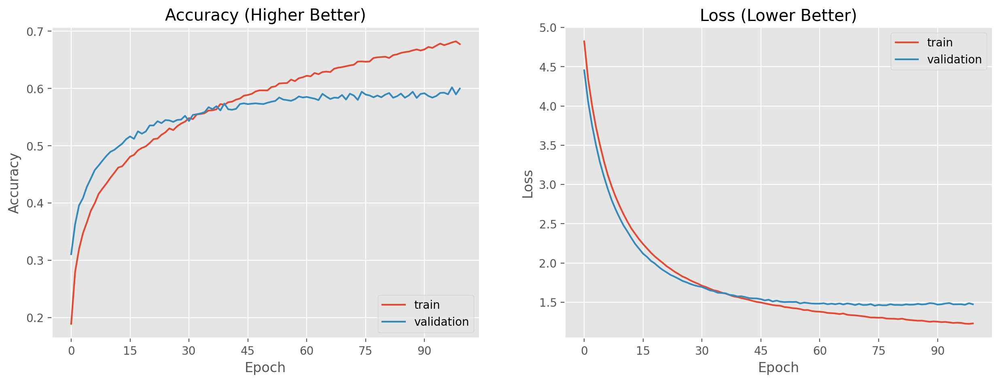

In [16]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [17]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 0 ... 3 6 7]


In [18]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [19]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [20]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_30592\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


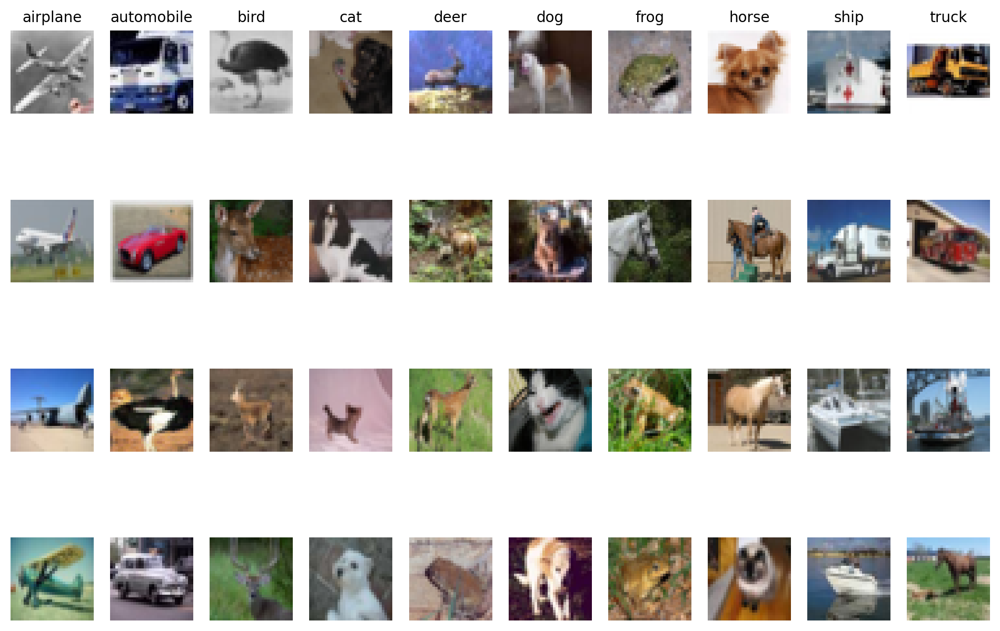

In [21]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 5 - Adding Learning Rate Scheduler) - MLP

### Import

In [22]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [23]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001
- Added Learning Rate Scheduler

In [24]:
model = Sequential(name='MLP_Tuned_5')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.6))

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])

lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5,min_lr=0.001)


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler] )




Model: "MLP_Tuned_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 3072)              0         
                                                                 
 dense_12 (Dense)            (None, 1024)              3146752   
                                                                 
 dropout_10 (Dropout)        (None, 1024)              0         
                                                                 
 dense_13 (Dense)            (None, 512)               524800    
                                                                 
 dropout_11 (Dropout)        (None, 512)               0         
                                                                 
 dense_14 (Dense)            (None, 256)               131328    
                                                                 
 dropout_12 (Dropout)        (None, 256)               

Epoch 90/100
176/176 [==============================] - 1s 8ms/step - loss: 1.2484 - accuracy: 0.6712 - val_loss: 1.4720 - val_accuracy: 0.5860 - lr: 1.0000e-04
Epoch 91/100
176/176 [==============================] - 1s 8ms/step - loss: 1.2519 - accuracy: 0.6688 - val_loss: 1.4682 - val_accuracy: 0.5942 - lr: 1.0000e-04
Epoch 92/100
176/176 [==============================] - 1s 7ms/step - loss: 1.2492 - accuracy: 0.6710 - val_loss: 1.4761 - val_accuracy: 0.5838 - lr: 1.0000e-04
Epoch 93/100
176/176 [==============================] - 1s 7ms/step - loss: 1.2503 - accuracy: 0.6721 - val_loss: 1.4736 - val_accuracy: 0.5886 - lr: 1.0000e-04
Epoch 94/100
176/176 [==============================] - 1s 7ms/step - loss: 1.2476 - accuracy: 0.6725 - val_loss: 1.4875 - val_accuracy: 0.5808 - lr: 1.0000e-04
Epoch 95/100
176/176 [==============================] - 1s 7ms/step - loss: 1.2447 - accuracy: 0.6735 - val_loss: 1.4797 - val_accuracy: 0.5826 - lr: 1.0000e-04
Epoch 96/100
176/176 [============

In [25]:
# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.4982 - accuracy: 0.5852
Test loss:  1.4981571435928345
Test accuracy: 0.5852000117301941


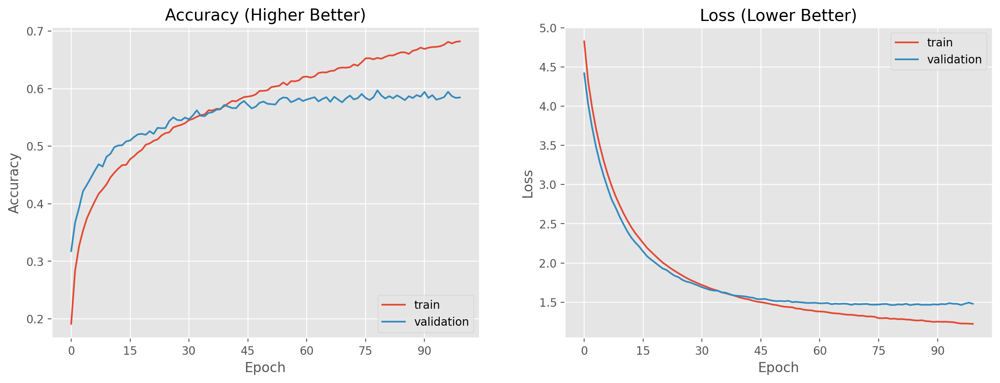

In [26]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [27]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 0 ... 3 6 7]


In [28]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [29]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [30]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_30592\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


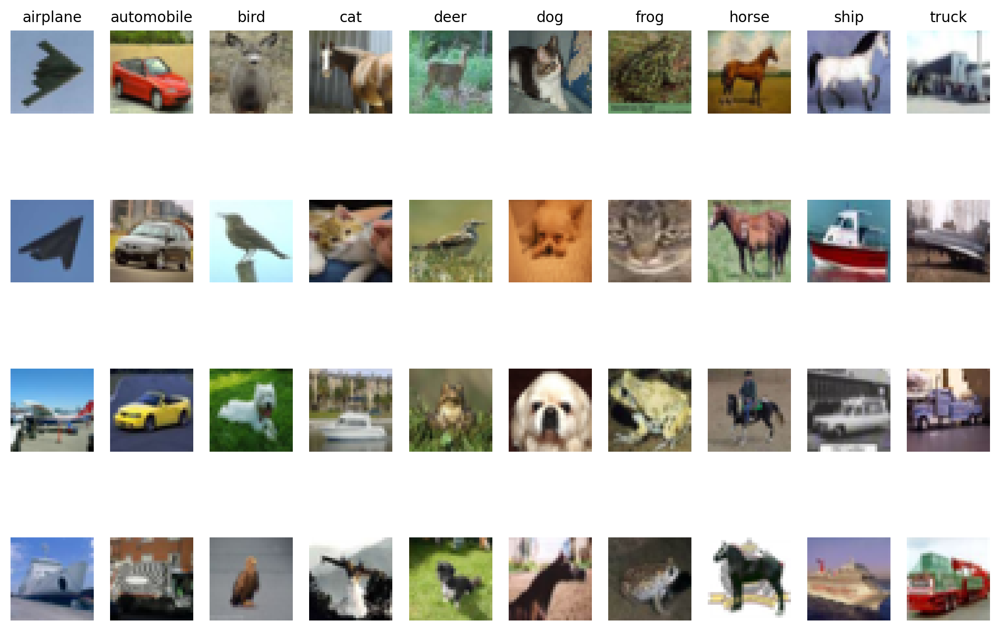

In [31]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 6 - Adding Batch Normalizer) - MLP

### Import

In [36]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [37]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001
- Added Learning Rate Scheduler

In [38]:
model = Sequential(name='MLP_Tuned_6')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.6))
BatchNormalization()

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
BatchNormalization()

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])

lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5,min_lr=0.001)


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler] )




Model: "MLP_Tuned_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_4 (Flatten)         (None, 3072)              0         
                                                                 
 dense_19 (Dense)            (None, 1024)              3146752   
                                                                 
 dropout_16 (Dropout)        (None, 1024)              0         
                                                                 
 dense_20 (Dense)            (None, 512)               524800    
                                                                 
 dropout_17 (Dropout)        (None, 512)               0         
                                                                 
 dense_21 (Dense)            (None, 256)               131328    
                                                                 
 dropout_18 (Dropout)        (None, 256)               

Epoch 90/100
176/176 [==============================] - 1s 8ms/step - loss: 1.2539 - accuracy: 0.6686 - val_loss: 1.4742 - val_accuracy: 0.5818 - lr: 1.0000e-04
Epoch 91/100
176/176 [==============================] - 1s 7ms/step - loss: 1.2467 - accuracy: 0.6730 - val_loss: 1.4635 - val_accuracy: 0.5944 - lr: 1.0000e-04
Epoch 92/100
176/176 [==============================] - 1s 8ms/step - loss: 1.2507 - accuracy: 0.6716 - val_loss: 1.4699 - val_accuracy: 0.5908 - lr: 1.0000e-04
Epoch 93/100
176/176 [==============================] - 1s 7ms/step - loss: 1.2376 - accuracy: 0.6748 - val_loss: 1.4790 - val_accuracy: 0.5870 - lr: 1.0000e-04
Epoch 94/100
176/176 [==============================] - 1s 8ms/step - loss: 1.2383 - accuracy: 0.6759 - val_loss: 1.4752 - val_accuracy: 0.5862 - lr: 1.0000e-04
Epoch 95/100
176/176 [==============================] - 1s 7ms/step - loss: 1.2411 - accuracy: 0.6743 - val_loss: 1.4742 - val_accuracy: 0.5898 - lr: 1.0000e-04
Epoch 96/100
176/176 [============

In [39]:
# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.5075 - accuracy: 0.5819
Test loss:  1.5074855089187622
Test accuracy: 0.5819000005722046


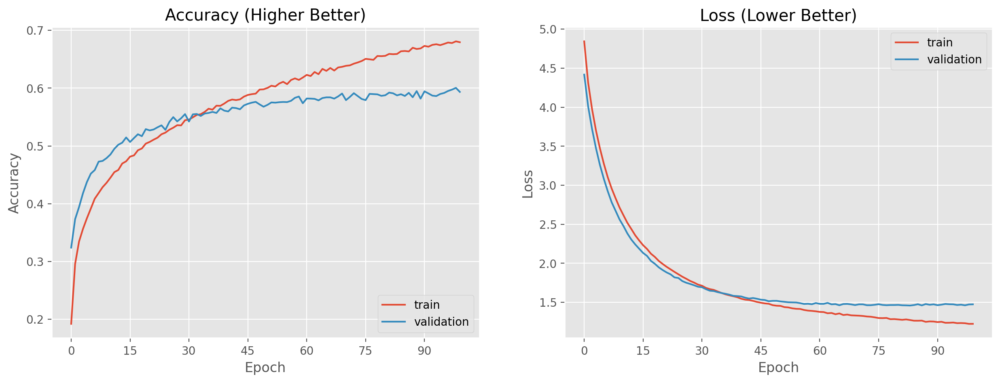

In [40]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [41]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 0 ... 3 6 7]


In [42]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [43]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [44]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_30592\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


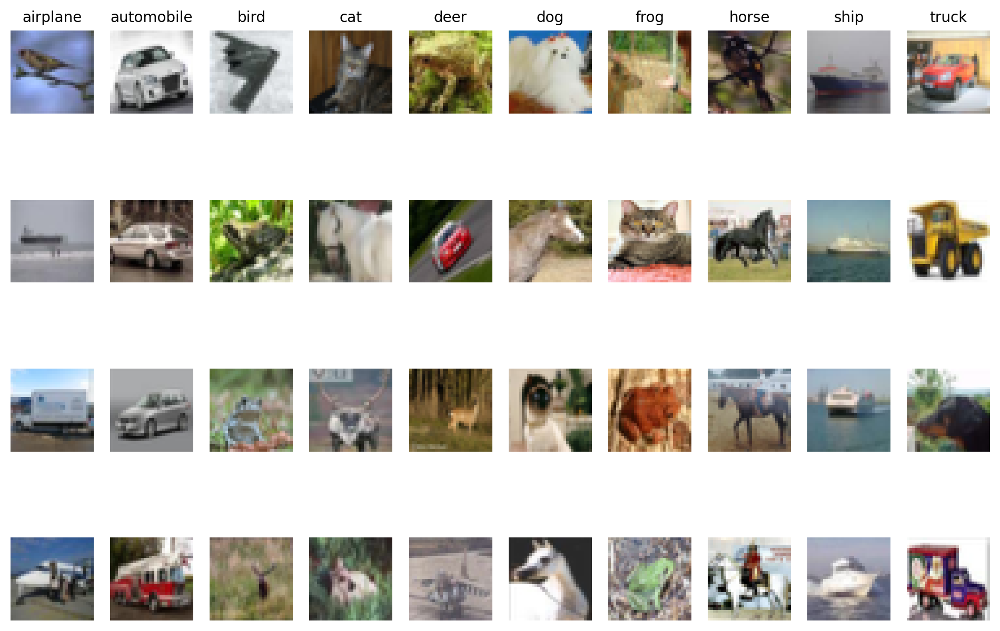

In [45]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 7 - Testing Different Learning Rate Scheduler) - MLP

### Import

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [3]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001
- Added Learning Rate Scheduler
- Tested different LR Scheduler

In [4]:
model = Sequential(name='MLP_Tuned_7')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.6))
BatchNormalization()

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
BatchNormalization()

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])

# Step 4: Train the model
def lr_schedule(epoch):
    lr = 0.002
    if epoch > 80:
        lr = 0.000001
    elif epoch > 60:
        lr = 0.00001
    elif epoch > 40:
        lr = 0.0001 
    elif epoch > 20:
        lr = 0.001
    print('Learning rate: ', lr)
    return lr

lr_scheduler = LearningRateScheduler(lr_schedule)


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler] )

# use for next model
# model_log = model.fit(x_train, y_train, epochs=200, batch_size=512, validation_split=0.1, callbacks=[lr_scheduler] )


Model: "MLP_Tuned_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Learning rate:  0.002
Epoch 1/200
88/88 [==============================] - 3s 13ms/step - loss: 3.5128 - accuracy: 0.2522 - val_loss: 2.5188 - val_accuracy: 0.3580 - lr: 0.0020
Learning rate:  0.002
Epoch 2/200
88/88 [==============================] - 1s 8ms/step - loss: 2.4326 - accuracy: 0.3289 - val_loss: 2.2127 - val_accuracy: 0.3796 - lr: 0.0020
Learning rate:  0.002
Epoch 3/200
88/88 [==============================] - 1s 8ms/step - loss: 2.2377 - accuracy: 0.3477 - val_loss: 2.1179 - val_accuracy: 0.3850 - lr: 0.0020
Learning rate:  0.002
Epoch 4/200
88/88 [==============================] - 1s 8ms/step - loss: 2.1523 - accuracy: 0.3566 - val_loss: 2.0614 - val_accuracy: 0.3768 - lr: 0.0020
Learning rate:  0.002
Epoch 5/200
88/88 [==============================] - 1s 8ms/step - loss: 2.1131 - accuracy: 0.3644 - val_loss: 1.9995 - val_accuracy: 0.4028 - lr: 0.0020
Learning rate:  0.002
Epoch 6/200
88/88 [==============================] - 1s 8ms/step - loss: 2.0901 - accuracy: 0.368

88/88 [==============================] - 1s 8ms/step - loss: 1.6155 - accuracy: 0.4993 - val_loss: 1.5469 - val_accuracy: 0.5238 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 48/200
88/88 [==============================] - 1s 8ms/step - loss: 1.6009 - accuracy: 0.5048 - val_loss: 1.5402 - val_accuracy: 0.5270 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 49/200
88/88 [==============================] - 1s 8ms/step - loss: 1.5896 - accuracy: 0.5066 - val_loss: 1.5323 - val_accuracy: 0.5292 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 50/200
88/88 [==============================] - 1s 8ms/step - loss: 1.5788 - accuracy: 0.5067 - val_loss: 1.5203 - val_accuracy: 0.5336 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 51/200
88/88 [==============================] - 1s 8ms/step - loss: 1.5699 - accuracy: 0.5126 - val_loss: 1.5177 - val_accuracy: 0.5360 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 52/200
88/88 [==============================] - 1s 8ms/step - loss: 1.5595 - accuracy: 0.5170 - v

88/88 [==============================] - 1s 8ms/step - loss: 1.4132 - accuracy: 0.5671 - val_loss: 1.4562 - val_accuracy: 0.5572 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 138/200
88/88 [==============================] - 1s 8ms/step - loss: 1.4143 - accuracy: 0.5659 - val_loss: 1.4561 - val_accuracy: 0.5574 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 139/200
88/88 [==============================] - 1s 8ms/step - loss: 1.4130 - accuracy: 0.5670 - val_loss: 1.4560 - val_accuracy: 0.5574 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 140/200
88/88 [==============================] - 1s 8ms/step - loss: 1.4145 - accuracy: 0.5690 - val_loss: 1.4560 - val_accuracy: 0.5574 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 141/200
88/88 [==============================] - 1s 8ms/step - loss: 1.4164 - accuracy: 0.5633 - val_loss: 1.4560 - val_accuracy: 0.5570 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 142/200
88/88 [==============================] - 1s 8ms/step - loss: 1.4160 - accuracy: 0.5677 - v

In [5]:
# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.4627 - accuracy: 0.5525
Test loss:  1.4627044200897217
Test accuracy: 0.5525000095367432


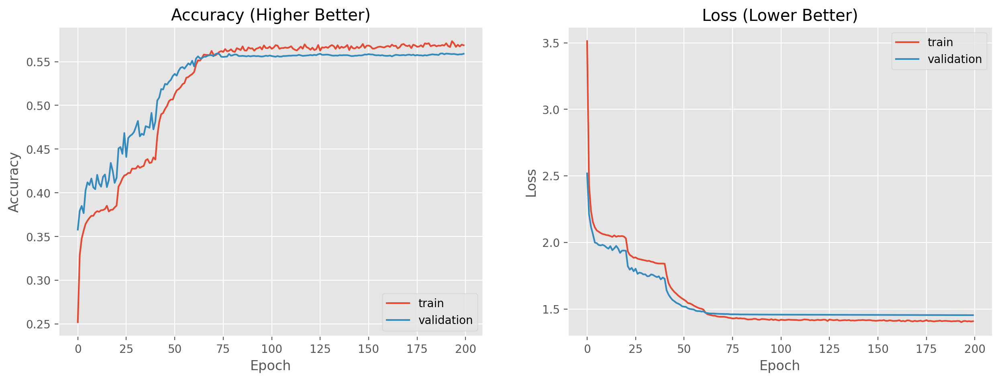

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [7]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 9 8 ... 5 6 7]


In [8]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


In [ ]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


C:\Users\mctro\AppData\Local\Temp\ipykernel_31264\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


Error in callback <function flush_figures at 0x000001A0F516A310> (for post_execute):


# <font color= maroon> Model Building (Tuned 8 - Increasing Batch Size & Epoch) - MLP 

### Import

In [3]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [4]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001
- Added Learning Rate Scheduler
- Tested different LR Scheduler
- Increased Batch Size & increase epoch

In [5]:
model = Sequential(name='MLP_Tuned_8')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.6))
BatchNormalization()

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
BatchNormalization()

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])

# Step 4: Train the model
def lr_schedule(epoch):
    lr = 0.002
    if epoch > 80:
        lr = 0.000001
    elif epoch > 60:
        lr = 0.00001
    elif epoch > 40:
        lr = 0.0001 
    elif epoch > 20:
        lr = 0.001
    print('Learning rate: ', lr)
    return lr

lr_scheduler = LearningRateScheduler(lr_schedule)


# model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler] )

# use for next model
model_log = model.fit(x_train, y_train, epochs=200, batch_size=512, validation_split=0.1, callbacks=[lr_scheduler] )


Model: "MLP_Tuned_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Learning rate:  0.002
Epoch 1/200
88/88 [==============================] - 2s 12ms/step - loss: 3.5003 - accuracy: 0.2433 - val_loss: 2.5405 - val_accuracy: 0.3390 - lr: 0.0020
Learning rate:  0.002
Epoch 2/200
88/88 [==============================] - 1s 8ms/step - loss: 2.4225 - accuracy: 0.3268 - val_loss: 2.2169 - val_accuracy: 0.3720 - lr: 0.0020
Learning rate:  0.002
Epoch 3/200
88/88 [==============================] - 1s 7ms/step - loss: 2.2247 - accuracy: 0.3449 - val_loss: 2.0927 - val_accuracy: 0.3924 - lr: 0.0020
Learning rate:  0.002
Epoch 4/200
88/88 [==============================] - 1s 7ms/step - loss: 2.1416 - accuracy: 0.3604 - val_loss: 2.0539 - val_accuracy: 0.3934 - lr: 0.0020
Learning rate:  0.002
Epoch 5/200
88/88 [==============================] - 1s 7ms/step - loss: 2.1095 - accuracy: 0.3600 - val_loss: 2.0144 - val_accuracy: 0.4050 - lr: 0.0020
Learning rate:  0.002
Epoch 6/200
88/88 [==============================] - 1s 7ms/step - loss: 2.0909 - accuracy: 0.367

88/88 [==============================] - 1s 7ms/step - loss: 1.6193 - accuracy: 0.4979 - val_loss: 1.5435 - val_accuracy: 0.5238 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 48/200
88/88 [==============================] - 1s 7ms/step - loss: 1.5986 - accuracy: 0.5038 - val_loss: 1.5349 - val_accuracy: 0.5250 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 49/200
88/88 [==============================] - 1s 7ms/step - loss: 1.5883 - accuracy: 0.5085 - val_loss: 1.5264 - val_accuracy: 0.5296 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 50/200
88/88 [==============================] - 1s 6ms/step - loss: 1.5827 - accuracy: 0.5080 - val_loss: 1.5239 - val_accuracy: 0.5322 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 51/200
88/88 [==============================] - 1s 7ms/step - loss: 1.5734 - accuracy: 0.5116 - val_loss: 1.5128 - val_accuracy: 0.5384 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 52/200
88/88 [==============================] - 1s 6ms/step - loss: 1.5613 - accuracy: 0.5145 - v

88/88 [==============================] - 1s 7ms/step - loss: 1.4174 - accuracy: 0.5690 - val_loss: 1.4544 - val_accuracy: 0.5570 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 138/200
88/88 [==============================] - 1s 6ms/step - loss: 1.4186 - accuracy: 0.5661 - val_loss: 1.4543 - val_accuracy: 0.5578 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 139/200
88/88 [==============================] - 1s 7ms/step - loss: 1.4143 - accuracy: 0.5659 - val_loss: 1.4541 - val_accuracy: 0.5572 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 140/200
88/88 [==============================] - 1s 6ms/step - loss: 1.4187 - accuracy: 0.5648 - val_loss: 1.4540 - val_accuracy: 0.5570 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 141/200
88/88 [==============================] - 1s 7ms/step - loss: 1.4135 - accuracy: 0.5672 - val_loss: 1.4540 - val_accuracy: 0.5572 - lr: 1.0000e-06
Learning rate:  1e-06
Epoch 142/200
88/88 [==============================] - 1s 7ms/step - loss: 1.4184 - accuracy: 0.5634 - v

In [6]:
# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.4642 - accuracy: 0.5494
Test loss:  1.4641634225845337
Test accuracy: 0.5493999719619751


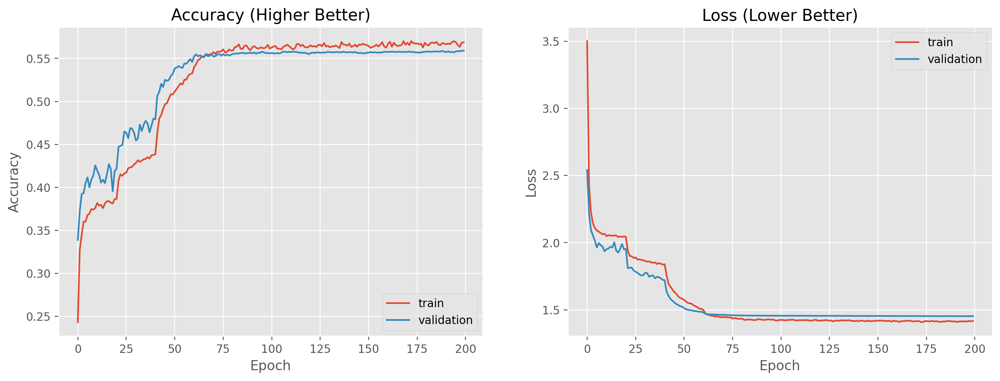

In [7]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [8]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 0s 1ms/step
[3 8 8 ... 5 6 7]


In [9]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [10]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [11]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_4092\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


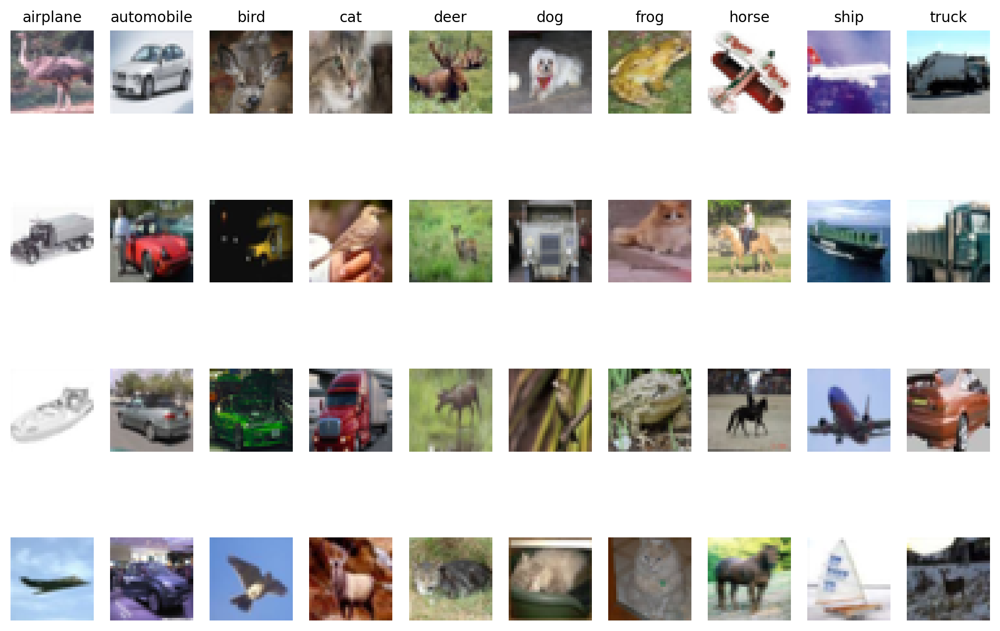

In [12]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 9 - Adding Scaling, std divide) - MLP

### Import

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [3]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255

# standard scaling
std_train = np.std(x_train, axis=(0,1,2))
x_train /= std_train
x_test /= std_train


# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001
- Added Learning Rate Scheduler
- Added Scaling

In [4]:
model = Sequential(name='MLP_Tuned_9')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.6))

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])

lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5,min_lr=0.001)


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler] )




Model: "MLP_Tuned_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/100
176/176 [==============================] - 6s 17ms/step - loss: 5.0700 - accuracy: 0.1645 - val_loss: 4.7754 - val_accuracy: 0.2900 - lr: 1.0000e-04
Epoch 2/100
176/176 [==============================] - 2s 13ms/step - loss: 4.7464 - accuracy: 0.2354 - val_loss: 4.5118 - val_accuracy: 0.3366 - lr: 1.0000e-04
Epoch 3/100
176/176 [==============================] - 2s 13ms/step - loss: 4.5246 - accuracy: 0.2726 - val_loss: 4.3058 - val_accuracy: 0.3646 - lr: 1.0000e-04
Epoch 4/100
176/176 [==============================] - 2s 13ms/step - loss: 4.3298 - accuracy: 0.3009 - val_loss: 4.1200 - val_accuracy: 0.3836 - lr: 1.0000e-04
Epoch 5/100
176/176 [==============================] - 2s 13ms/step - loss: 4.1659 - accuracy: 0.3196 - val_loss: 3.9626 - val_accuracy: 0.3916 - lr: 1.0000e-04
Epoch 6/100
176/176 [==============================] - 2s 13ms/step - loss: 3.9998 - accuracy: 0.3376 - val_loss: 3.8089 - val_accuracy: 0.4052 - lr: 1.0000e-04
Epoch 7/100
176/176 [=============

Epoch 52/100
176/176 [==============================] - 2s 14ms/step - loss: 1.5717 - accuracy: 0.5737 - val_loss: 1.5902 - val_accuracy: 0.5652 - lr: 1.0000e-04
Epoch 53/100
176/176 [==============================] - 3s 15ms/step - loss: 1.5561 - accuracy: 0.5774 - val_loss: 1.5780 - val_accuracy: 0.5744 - lr: 1.0000e-04
Epoch 54/100
176/176 [==============================] - 2s 14ms/step - loss: 1.5546 - accuracy: 0.5770 - val_loss: 1.5752 - val_accuracy: 0.5682 - lr: 1.0000e-04
Epoch 55/100
176/176 [==============================] - 2s 13ms/step - loss: 1.5343 - accuracy: 0.5812 - val_loss: 1.5658 - val_accuracy: 0.5672 - lr: 1.0000e-04
Epoch 56/100
176/176 [==============================] - 2s 13ms/step - loss: 1.5331 - accuracy: 0.5826 - val_loss: 1.5653 - val_accuracy: 0.5672 - lr: 1.0000e-04
Epoch 57/100
176/176 [==============================] - 2s 13ms/step - loss: 1.5198 - accuracy: 0.5855 - val_loss: 1.5689 - val_accuracy: 0.5694 - lr: 1.0000e-04
Epoch 58/100
176/176 [======

In [5]:
# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 2s 7ms/step - loss: 1.4703 - accuracy: 0.5784
Test loss:  1.470260500907898
Test accuracy: 0.5784000158309937


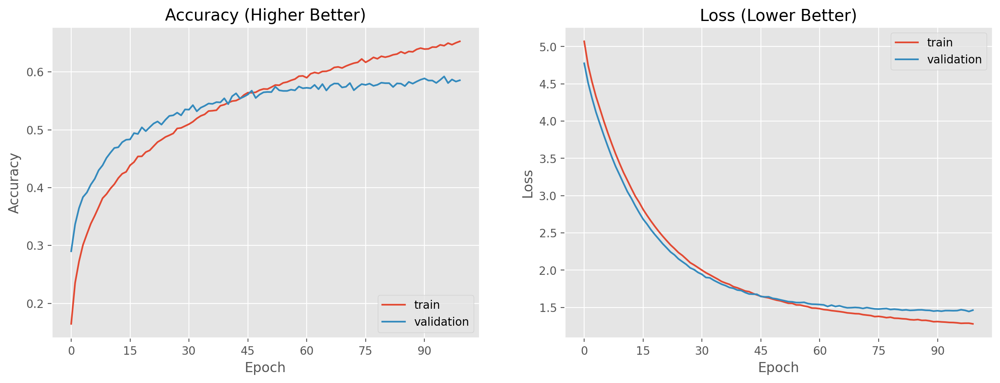

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [7]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 2s 4ms/step
[3 8 0 ... 2 4 7]


In [8]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_28552\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


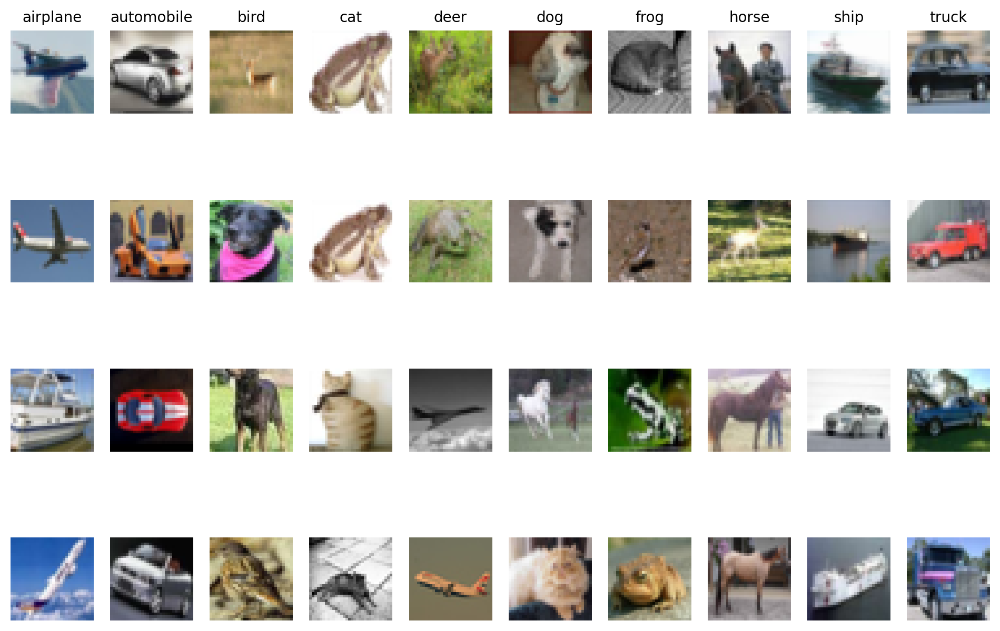

In [11]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


C:\Users\mctro\AppData\Local\Temp\ipykernel_5620\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


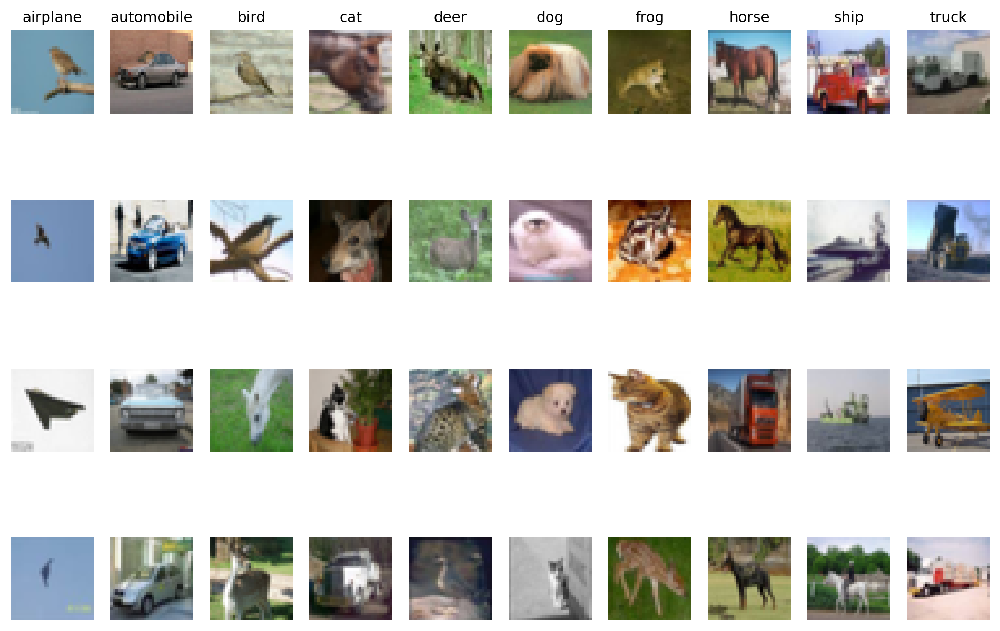

In [52]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 10) - MLP

### Import

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [3]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255

# standard scaling
std_train = np.std(x_train, axis=(0,1,2))
x_train /= std_train
x_test /= std_train


# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001
- Added Learning Rate Scheduler
- Removed Scaling & Increased dropout & removed first layer 

In [6]:
model = Sequential(name='MLP_Tuned_10')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.6))

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.5))

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.3))

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])

lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5,min_lr=0.001)


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler] )




Model: "MLP_Tuned_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 512)               1573376   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)              

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/100
176/176 [==============================] - 6s 17ms/step - loss: 6.5113 - accuracy: 0.1990 - val_loss: 6.0234 - val_accuracy: 0.3400 - lr: 1.0000e-04
Epoch 2/100
176/176 [==============================] - 3s 14ms/step - loss: 5.9393 - accuracy: 0.2729 - val_loss: 5.5786 - val_accuracy: 0.3730 - lr: 1.0000e-04
Epoch 3/100
176/176 [==============================] - 2s 14ms/step - loss: 5.5023 - accuracy: 0.3088 - val_loss: 5.1711 - val_accuracy: 0.3934 - lr: 1.0000e-04
Epoch 4/100
176/176 [==============================] - 2s 13ms/step - loss: 5.1131 - accuracy: 0.3308 - val_loss: 4.7986 - val_accuracy: 0.4064 - lr: 1.0000e-04
Epoch 5/100
176/176 [==============================] - 2s 13ms/step - loss: 4.7542 - accuracy: 0.3486 - val_loss: 4.4561 - val_accuracy: 0.4202 - lr: 1.0000e-04
Epoch 6/100
176/176 [==============================] - 2s 13ms/step - loss: 4.4280 - accuracy: 0.3640 - val_loss: 4.1505 - val_accuracy: 0.4362 - lr: 1.0000e-04
Epoch 7/100
176/176 [=============

Epoch 52/100
176/176 [==============================] - 3s 16ms/step - loss: 1.4962 - accuracy: 0.5629 - val_loss: 1.5172 - val_accuracy: 0.5506 - lr: 1.0000e-04
Epoch 53/100
176/176 [==============================] - 3s 16ms/step - loss: 1.4991 - accuracy: 0.5618 - val_loss: 1.5031 - val_accuracy: 0.5586 - lr: 1.0000e-04
Epoch 54/100
176/176 [==============================] - 3s 16ms/step - loss: 1.4838 - accuracy: 0.5683 - val_loss: 1.4996 - val_accuracy: 0.5598 - lr: 1.0000e-04
Epoch 55/100
176/176 [==============================] - 3s 20ms/step - loss: 1.4834 - accuracy: 0.5668 - val_loss: 1.4906 - val_accuracy: 0.5556 - lr: 1.0000e-04
Epoch 56/100
176/176 [==============================] - 2s 13ms/step - loss: 1.4710 - accuracy: 0.5710 - val_loss: 1.4809 - val_accuracy: 0.5688 - lr: 1.0000e-04
Epoch 57/100
176/176 [==============================] - 2s 13ms/step - loss: 1.4693 - accuracy: 0.5710 - val_loss: 1.4832 - val_accuracy: 0.5652 - lr: 1.0000e-04
Epoch 58/100
176/176 [======

In [7]:
# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 3s 8ms/step - loss: 1.4673 - accuracy: 0.5717
Test loss:  1.4673441648483276
Test accuracy: 0.5716999769210815


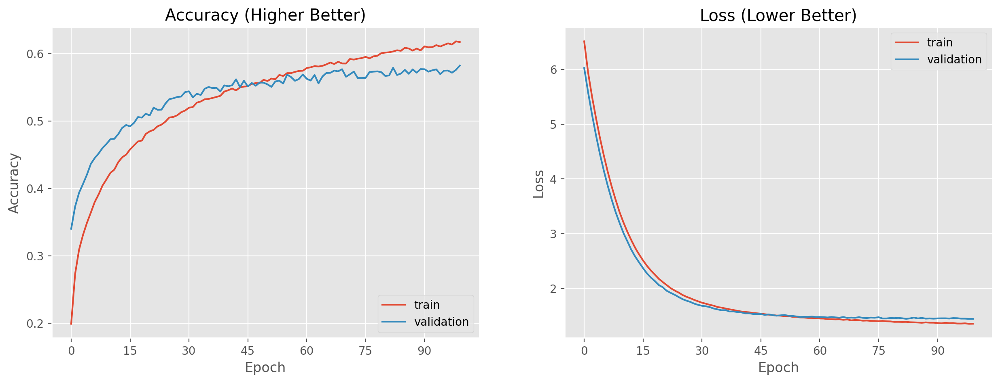

In [8]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [9]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 2s 5ms/step
[3 9 0 ... 5 5 7]


In [10]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [11]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [12]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_28180\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


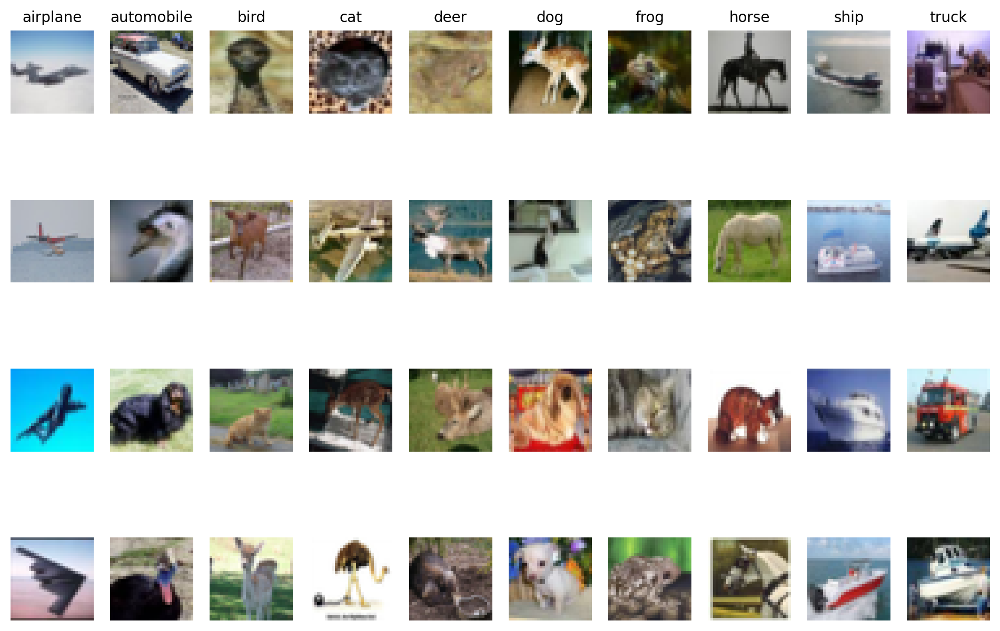

In [13]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 11) - MLP

### Import

In [14]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [15]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255

# standard scaling
std_train = np.std(x_train, axis=(0,1,2))
x_train /= std_train
x_test /= std_train


# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

### <font color=purple>Changes Made</font> 
- Changed Optimizer
- Added New Layers
- Increased epoch
- Added Dropout to prevent overfitting
- Removed Layer
- Added Kernel Regularizers L2 0.001
- Added Learning Rate Scheduler
- Removed Scaling & Increased dropout & removed first layer 

In [16]:
model = Sequential(name='MLP_Tuned_11')
model.add(Flatten(input_shape=(32, 32, 3)))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.5))

# model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.6))

model.add(Dense(512, activation=LeakyReLU(), kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.5))

model.add(Dense(256, activation=LeakyReLU(), kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.3))

model.add(Dense(128, activation=LeakyReLU(), kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.2))

model.add(Dense(64, activation=LeakyReLU(), kernel_regularizer=regularizers.l2(0.003)))
model.add(Dropout(0.2))

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])

lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5,min_lr=0.001)


model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler] )




Model: "MLP_Tuned_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 3072)              0         
                                                                 
 dense_5 (Dense)             (None, 512)               1573376   
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 128)               32896     
                                                                 
 dropout_6 (Dropout)         (None, 128)              

Epoch 41/100
176/176 [==============================] - 2s 12ms/step - loss: 1.6616 - accuracy: 0.5029 - val_loss: 1.6236 - val_accuracy: 0.5192 - lr: 1.0000e-04
Epoch 42/100
176/176 [==============================] - 2s 14ms/step - loss: 1.6492 - accuracy: 0.5055 - val_loss: 1.6089 - val_accuracy: 0.5230 - lr: 1.0000e-04
Epoch 43/100
176/176 [==============================] - 2s 14ms/step - loss: 1.6455 - accuracy: 0.5055 - val_loss: 1.5973 - val_accuracy: 0.5258 - lr: 1.0000e-04
Epoch 44/100
176/176 [==============================] - 2s 12ms/step - loss: 1.6375 - accuracy: 0.5073 - val_loss: 1.5924 - val_accuracy: 0.5270 - lr: 1.0000e-04
Epoch 45/100
176/176 [==============================] - 2s 13ms/step - loss: 1.6303 - accuracy: 0.5094 - val_loss: 1.5956 - val_accuracy: 0.5184 - lr: 1.0000e-04
Epoch 46/100
176/176 [==============================] - 2s 14ms/step - loss: 1.6218 - accuracy: 0.5099 - val_loss: 1.5740 - val_accuracy: 0.5294 - lr: 1.0000e-04
Epoch 47/100
176/176 [======

Epoch 92/100
176/176 [==============================] - 1s 5ms/step - loss: 1.5150 - accuracy: 0.5333 - val_loss: 1.4794 - val_accuracy: 0.5478 - lr: 1.0000e-04
Epoch 93/100
176/176 [==============================] - 1s 5ms/step - loss: 1.5092 - accuracy: 0.5377 - val_loss: 1.4922 - val_accuracy: 0.5352 - lr: 1.0000e-04
Epoch 94/100
176/176 [==============================] - 1s 5ms/step - loss: 1.5125 - accuracy: 0.5338 - val_loss: 1.4900 - val_accuracy: 0.5432 - lr: 1.0000e-04
Epoch 95/100
176/176 [==============================] - 1s 5ms/step - loss: 1.5145 - accuracy: 0.5357 - val_loss: 1.4771 - val_accuracy: 0.5410 - lr: 1.0000e-04
Epoch 96/100
176/176 [==============================] - 1s 5ms/step - loss: 1.5094 - accuracy: 0.5369 - val_loss: 1.4828 - val_accuracy: 0.5488 - lr: 1.0000e-04
Epoch 97/100
176/176 [==============================] - 1s 5ms/step - loss: 1.5023 - accuracy: 0.5407 - val_loss: 1.4737 - val_accuracy: 0.5452 - lr: 1.0000e-04
Epoch 98/100
176/176 [============

In [17]:
# score = model.evaluate(x_test, y_test, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])


# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.4928 - accuracy: 0.5383
Test loss:  1.4927959442138672
Test accuracy: 0.5382999777793884


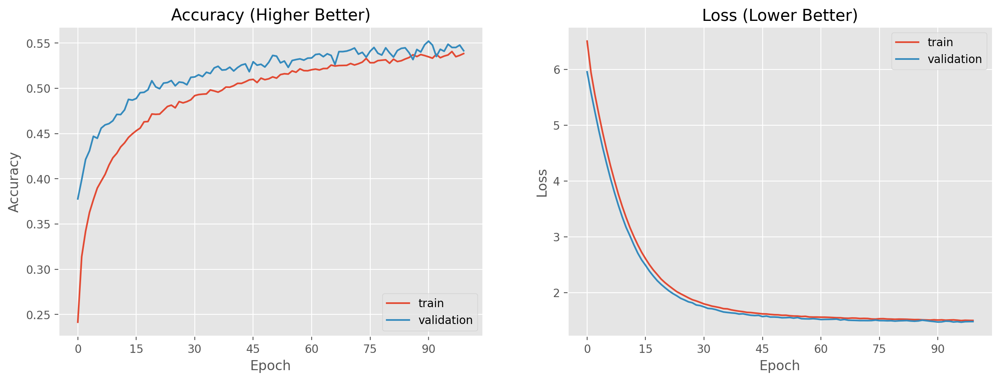

In [18]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [19]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 0 ... 3 5 7]


In [20]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [21]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [22]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_28180\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


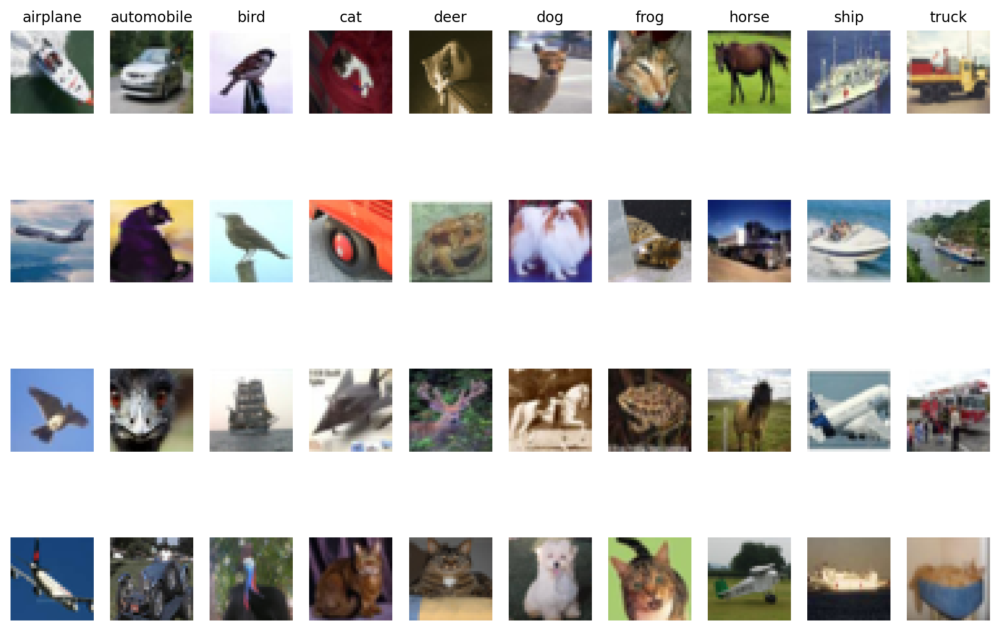

In [23]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned 12) - MLP

### Import

In [24]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [25]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network


In [26]:
model = Sequential(name='MLP_Tuned_12')
model.add(Flatten(input_shape=(32, 32, 3)))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
BatchNormalization()

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.3))
BatchNormalization()

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])


def lr_schedule(epoch):
    lr = 0.0001
    if epoch > 75:
        lr = 0.00001
    print('Learning rate: ', lr)
    return lr


# define leaerning rate scheduler
lr_scheduler = LearningRateScheduler(lr_schedule)
# lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.001)


# # define early stopper 
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_log = model.fit(x_train, y_train, epochs=100, batch_size=128, validation_split=0.1, callbacks=[lr_scheduler])
# model_log = model.fit(x_train, y_train, epochs=100, batch_size=64, validation_split=0.1, callbacks=[early_stop, lr_scheduler])




Model: "MLP_Tuned_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 3072)              0         
                                                                 
 dense_10 (Dense)            (None, 1024)              3146752   
                                                                 
 dropout_8 (Dropout)         (None, 1024)              0         
                                                                 
 dense_11 (Dense)            (None, 512)               524800    
                                                                 
 dropout_9 (Dropout)         (None, 512)               0         
                                                                 
 dense_12 (Dense)            (None, 256)               131328    
                                                                 
 dropout_10 (Dropout)        (None, 256)              

Learning rate:  1e-05
Epoch 79/100
352/352 [==============================] - 2s 5ms/step - loss: 0.9198 - accuracy: 0.8190 - val_loss: 1.5732 - val_accuracy: 0.6094 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 80/100
352/352 [==============================] - 2s 5ms/step - loss: 0.9089 - accuracy: 0.8245 - val_loss: 1.5761 - val_accuracy: 0.6076 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 81/100
352/352 [==============================] - 2s 5ms/step - loss: 0.8939 - accuracy: 0.8255 - val_loss: 1.5801 - val_accuracy: 0.6076 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 82/100
352/352 [==============================] - 2s 5ms/step - loss: 0.8867 - accuracy: 0.8307 - val_loss: 1.5838 - val_accuracy: 0.6068 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 83/100
352/352 [==============================] - 2s 5ms/step - loss: 0.8857 - accuracy: 0.8313 - val_loss: 1.5866 - val_accuracy: 0.6062 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 84/100
352/352 [==============================] - 2s 6ms/

In [27]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.6774 - accuracy: 0.6013
Test loss:  1.6773748397827148
Test accuracy: 0.6013000011444092


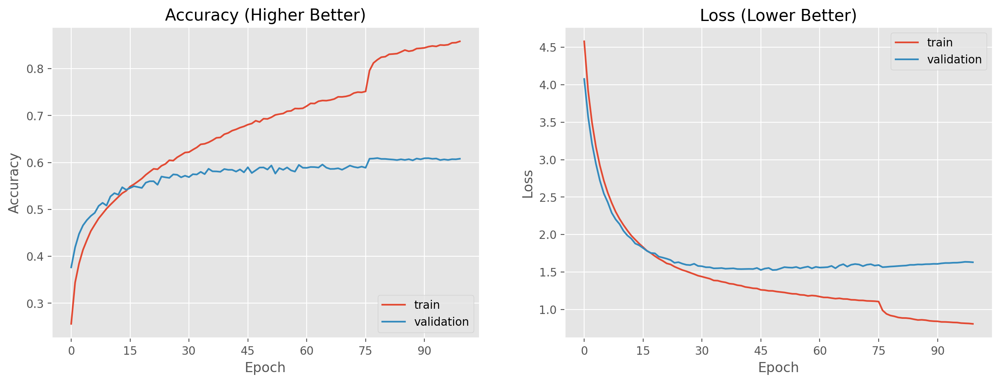

In [28]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [29]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 1ms/step
[3 8 0 ... 5 4 7]


In [30]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [31]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [32]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_28180\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


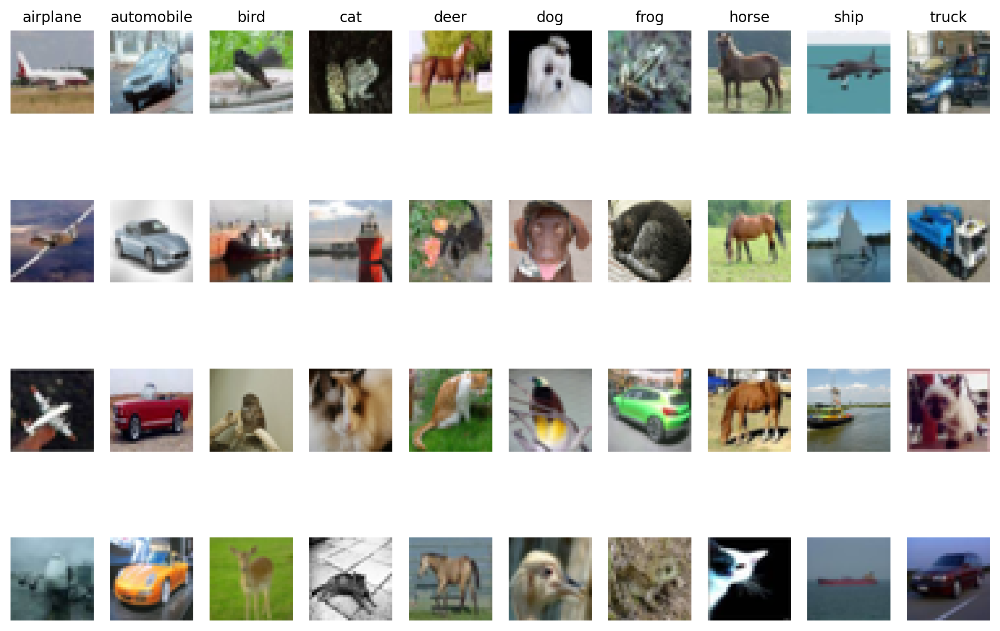

In [33]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Tuned Final) - MLP

### Import

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


### Data Preprocessing

In [3]:
# compute mean image
mean_image = np.mean(x_train, axis=0)

# convert x_train and x_test to float64
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# normalisation
x_train /= 255
x_test /= 255



# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network


### <font color='maroon'>Considerations when building </font>

### Use a different activation function
- Using Rectifying Linear Unit gives 

### Use Deep Learning Optimisers for back propagation
<b>Adam Deep Learning Optimizer</b>
- Adam deep learning makes use of learning rate updating for each network weight individually. Unlike maintaining single learning rate through SGD. Faster running time, low memory requirements & less tuning. Optimizers are algorithms that updates weights & biases of the neurons to minimise error or loss during training. 

- Optimiser uses gradient of loss function with respect to model's parameters aka the derivitive in the direction that minimises loss. 

### Use call backs
- Some call backs used are LearninRateScheduler, Early_stopper

### Use of batch normalisation

In [4]:


# # build model using MLP 
# model = Sequential(name='MLP_Tuned')
# model.add(Flatten(input_shape=(32, 32, 3))) # input shape flattened to one dimensional, 32x32x3 = 3072, input_shape=3072
# model.add(Dense(1024, activation='relu'))
# model.add(Dense(512, activation='relu'))
# model.add(Dense(256, activation='relu')) # added new layers 
# model.add(Dense(128, activation='relu'))
# model.add(Dense(64, activation='relu'))
# model.add(Dense(10, activation='softmax'))

# model.summary()

# # loss function set as categorical_crossentropy optimiser = RMSprop()
# model.compile(loss='categorical_crossentropy',
#               optimizer=tf.keras.optimizers.Adam(lr=0.0000001), # changed to Adam(lr=0.001)
#               metrics=['accuracy'])


# # model_log = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_data=(x_test, (y_test)))
# model_log = model.fit(x_train, y_train, epochs=40, batch_size=32, validation_split=0.1)




# model = Sequential(name='MLP_Tuned')
# model.add(Flatten(input_shape=(32, 32, 3)))
# model.add(Dense(1024, activation=LeakyReLU(alpha=0.1), kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.2))
# model.add(Dense(512, activation=LeakyReLU(alpha=0.1), kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.2))
# model.add(Dense(256, activation=LeakyReLU(alpha=0.1), kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.2))
# model.add(Dense(128, activation=LeakyReLU(alpha=0.1), kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.2))
# model.add(Dense(64, activation=LeakyReLU(alpha=0.1), kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dropout(0.2))
# model.add(Dense(10, activation='softmax'))


datagen = ImageDataGenerator(
    rotation_range=20, # randomly rotate images by up to 20 degrees
    width_shift_range=0.2, # randomly shift images horizontally by up to 20% of the image width
    height_shift_range=0.2, # randomly shift images vertically by up to 20% of the image height
    horizontal_flip=True, # randomly flip images horizontally
    vertical_flip=False, # do not flip images vertically
    zoom_range=[0.8, 1.2] # randomly zoom images by up to 20%
)


model = Sequential(name='MLP_Final')
model.add(Flatten(input_shape=(32, 32, 3)))

model.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
BatchNormalization()

model.add(Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.3))
BatchNormalization()

model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
BatchNormalization()

model.add(Dense(10, activation='softmax')) 

# print summary 
model.summary()

# compile model
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.0001),
              metrics=['accuracy'])


def lr_schedule(epoch):
    lr = 0.0001
#     if epoch > 50 :
#         lr = 0.00001
    if epoch > 75:
        lr = 0.00001
#     if epoch > 100:
#         lr = 0.000001
    print('Learning rate: ', lr)
    return lr

# def lr_schedule(epoch):
#     lr = 0.0001
#     if epoch > 80:
#         lr *= 0.000000001
#     elif epoch > 60:
#         lr *= 0.0000001
#     elif epoch > 40:
#         lr *= 0.000001
#     elif epoch > 20:
#         lr *= 0.00001
#     print('Learning rate: ', lr)
#     return lr


# define leaerning rate scheduler
lr_scheduler = LearningRateScheduler(lr_schedule)
# lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.001)


# # define early stopper 
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_log = model.fit(x_train, y_train, epochs=100, batch_size=256, validation_split=0.1, callbacks=[lr_scheduler])
# model_log = model.fit(x_train, y_train, epochs=100, batch_size=64, validation_split=0.1, callbacks=[early_stop, lr_scheduler])




Model: "MLP_Final"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 3072)              0         
                                                                 
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               0 

C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Learning rate:  0.0001
Epoch 1/100
176/176 [==============================] - 6s 15ms/step - loss: 4.7066 - accuracy: 0.2420 - val_loss: 4.2722 - val_accuracy: 0.3620 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 2/100
176/176 [==============================] - 2s 14ms/step - loss: 4.1676 - accuracy: 0.3358 - val_loss: 3.8716 - val_accuracy: 0.4090 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 3/100
176/176 [==============================] - 2s 13ms/step - loss: 3.8229 - accuracy: 0.3699 - val_loss: 3.5745 - val_accuracy: 0.4292 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 4/100
176/176 [==============================] - 2s 13ms/step - loss: 3.5488 - accuracy: 0.3943 - val_loss: 3.3208 - val_accuracy: 0.4548 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 5/100
176/176 [==============================] - 2s 13ms/step - loss: 3.3154 - accuracy: 0.4165 - val_loss: 3.1229 - val_accuracy: 0.4652 - lr: 1.0000e-04
Learning rate:  0.0001
Epoch 6/100
176/176 [==============================] - 2s

176/176 [==============================] - 2s 13ms/step - loss: 0.8353 - accuracy: 0.8430 - val_loss: 1.6280 - val_accuracy: 0.5972 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 90/100
176/176 [==============================] - 2s 13ms/step - loss: 0.8388 - accuracy: 0.8414 - val_loss: 1.6305 - val_accuracy: 0.6020 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 91/100
176/176 [==============================] - 2s 13ms/step - loss: 0.8262 - accuracy: 0.8455 - val_loss: 1.6326 - val_accuracy: 0.6048 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 92/100
176/176 [==============================] - 2s 12ms/step - loss: 0.8269 - accuracy: 0.8460 - val_loss: 1.6318 - val_accuracy: 0.6020 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 93/100
176/176 [==============================] - 2s 12ms/step - loss: 0.8275 - accuracy: 0.8448 - val_loss: 1.6308 - val_accuracy: 0.6046 - lr: 1.0000e-05
Learning rate:  1e-05
Epoch 94/100
176/176 [==============================] - 2s 12ms/step - loss: 0.8233 - accurac

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 2s 6ms/step - loss: 1.6949 - accuracy: 0.5921
Test loss:  1.6948734521865845
Test accuracy: 0.5921000242233276


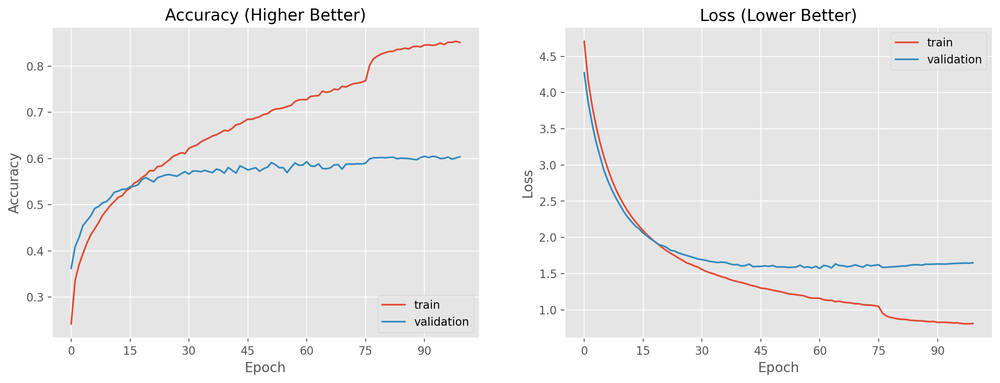

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))


In [7]:
predict_x = model.predict(x_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 3ms/step
[3 8 0 ... 5 6 7]


In [8]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# err_x = x_test[ind[0]]
# err_y = output[ind[0]]

# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = x_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_29796\3716447859.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


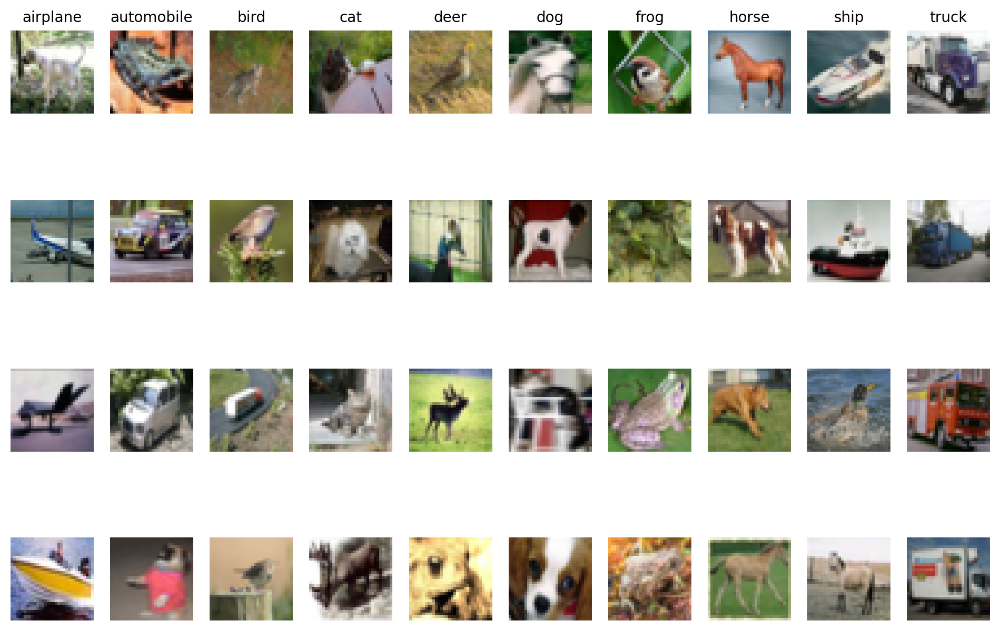

In [11]:
# visualise data a bit 
examples_per_class = 8 # number of examples you want to see from each class
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)


# <font color= maroon> Model Building (Baseline) - LeNET-5 CNN

### Import

In [9]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [23]:
# no need to reshape data as we are able to flatten the dataset before feeding it into the model 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation
X_train /= 255
X_test /= 255

# convert to categorical before running model 
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network

In [11]:

# build LeNet5 model     
model = Sequential(name='LeNET_Baseline')
model.add(Conv2D(6, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3))) #filter 
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(16, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='relu'))
model.add(Dense(84, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


# fit the model
model_log = model.fit(X_train, 
          y_train, 
          epochs=100, 
          batch_size=32, 
          validation_data=(X_test, y_test))
    
# LeNet5(X_train, y_train, y_test)


Model: "LeNET_Baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 6)         456       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 6)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 16)        2416      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 400)               0         
                                                                 
 dense (Dense)               (None, 120)            

In [12]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test,y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 4.1600 - accuracy: 0.5740
Test loss:  4.160017013549805
Test accuracy: 0.5740000009536743


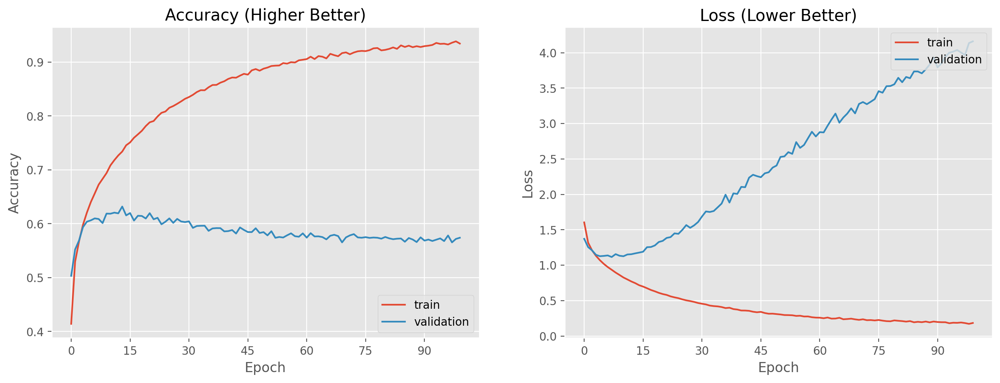

In [13]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [14]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[5 1 8 ... 5 0 7]


In [15]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [16]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [17]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_5620\4135961022.py:12: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


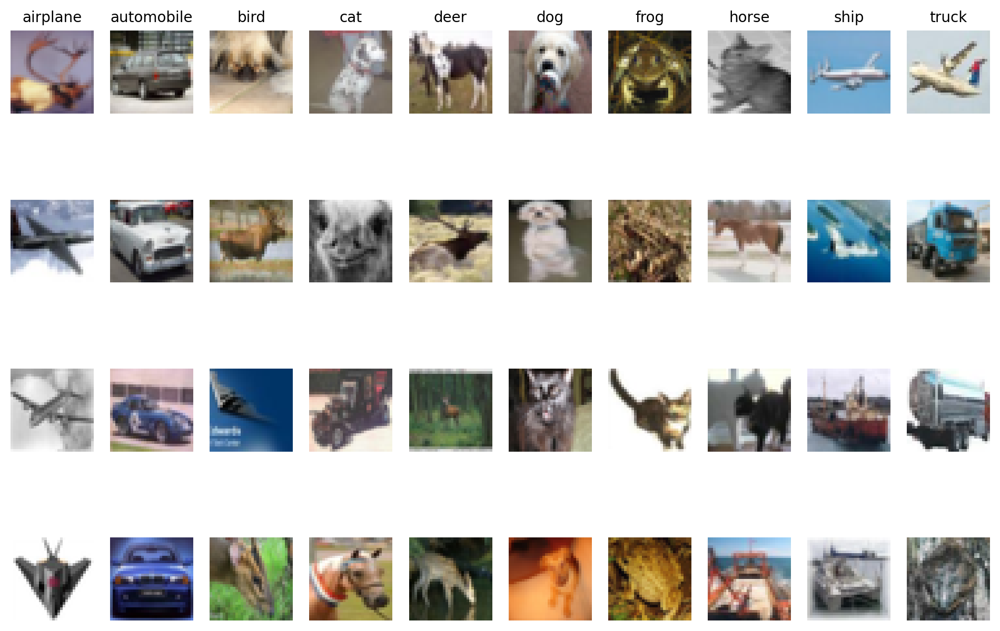

In [22]:
# Define class names
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 1) - LeNET-5 CNN

### Import

In [28]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [29]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 

In [30]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_1')
model.add(Conv2D(6, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(16, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='relu'))
model.add(Dense(84, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 28, 28, 6)         456       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 14, 14, 6)        0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 10, 10, 16)        2416      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 400)               0         
                                                                 
 dense_6 (Dense)             (None, 120)             

In [33]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 4.7123 - accuracy: 0.5862
Test loss:  4.712294101715088
Test accuracy: 0.5861999988555908


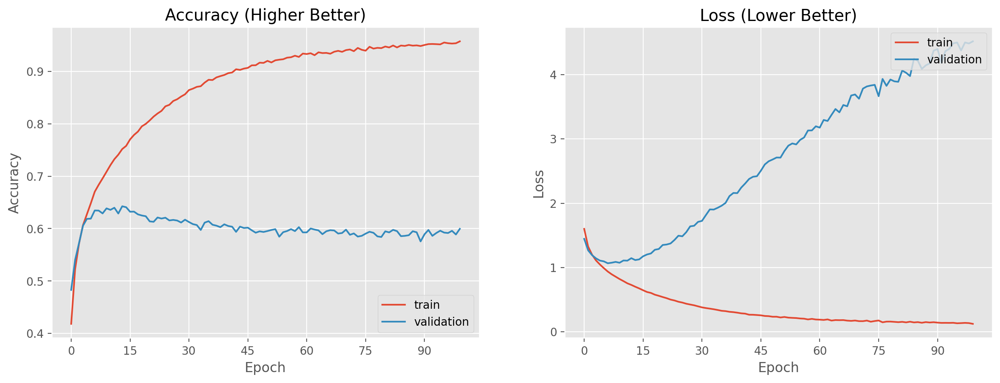

In [34]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [35]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[8 8 8 ... 5 1 7]


In [36]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [37]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [38]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_5620\1182170958.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


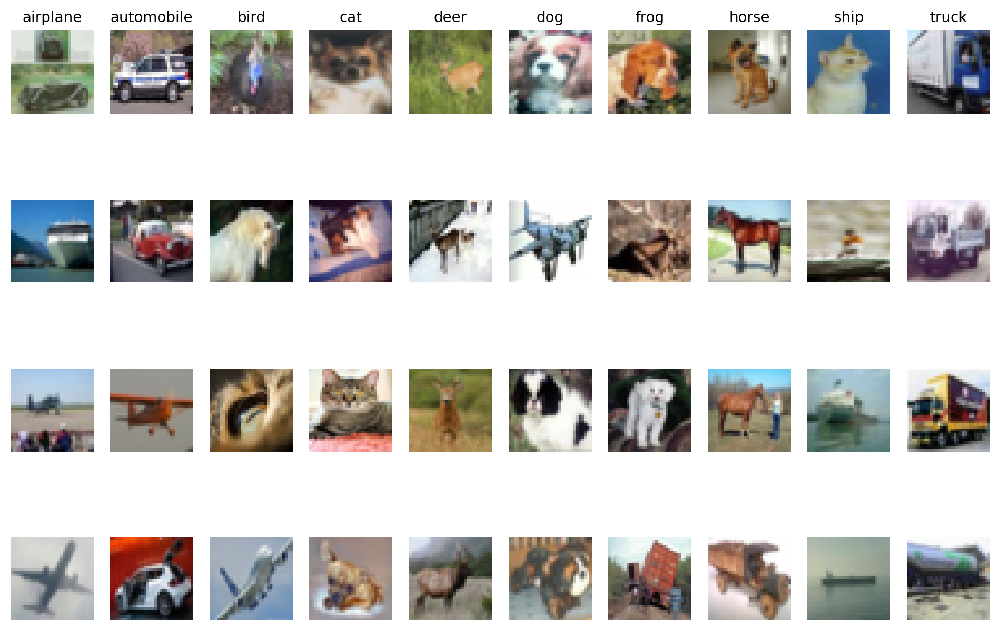

In [39]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 2) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 32 to 256 in attempt to prevent overfitting

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_2')
model.add(Conv2D(6, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(16, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='relu'))
model.add(Dense(84, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=256, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 6)         456       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 6)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 16)        2416      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 400)               0         
                                                                 
 dense (Dense)               (None, 120)             

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 3s 8ms/step - loss: 3.3347 - accuracy: 0.5879
Test loss:  3.334704637527466
Test accuracy: 0.5878999829292297


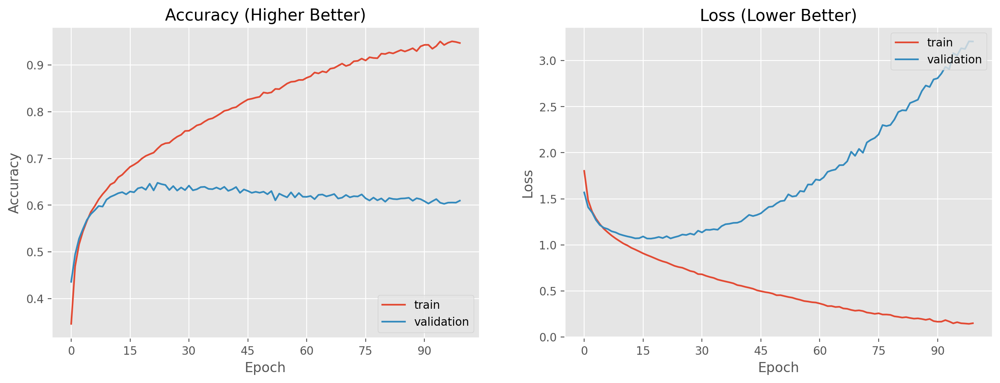

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 2s 4ms/step
[3 8 8 ... 5 4 7]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_20916\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


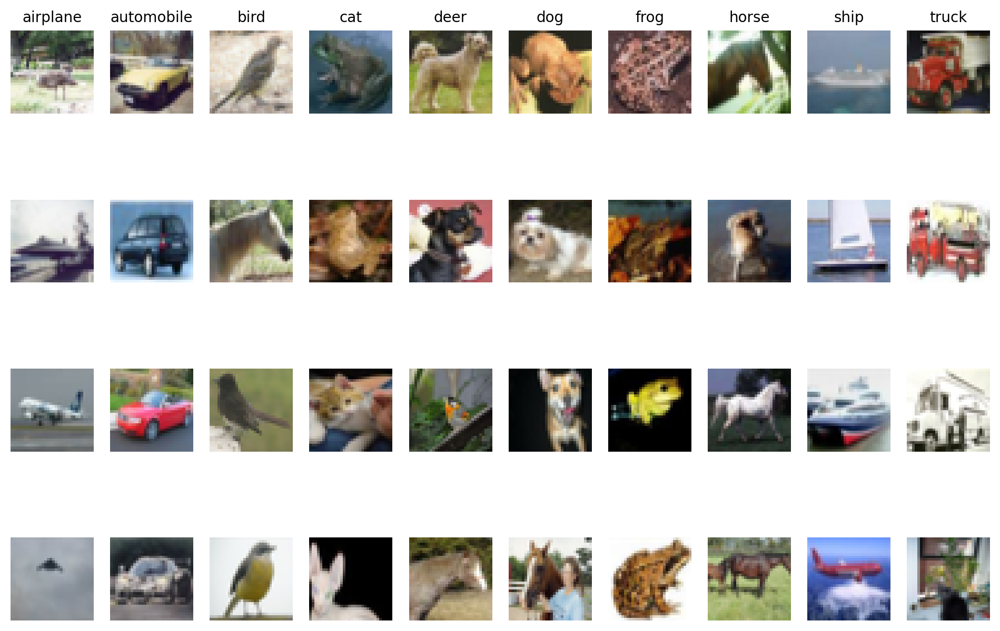

In [12]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 3) - LeNET-5 CNN

### Import

In [13]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [14]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting

In [15]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_3')
model.add(Conv2D(6, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(16, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='relu'))
model.add(Dense(84, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 28, 28, 6)         456       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 6)        0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 10, 10, 16)        2416      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 400)               0         
                                                                 
 dense_3 (Dense)             (None, 120)             

In [16]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 2s 7ms/step - loss: 4.3727 - accuracy: 0.6002
Test loss:  4.372700214385986
Test accuracy: 0.6001999974250793


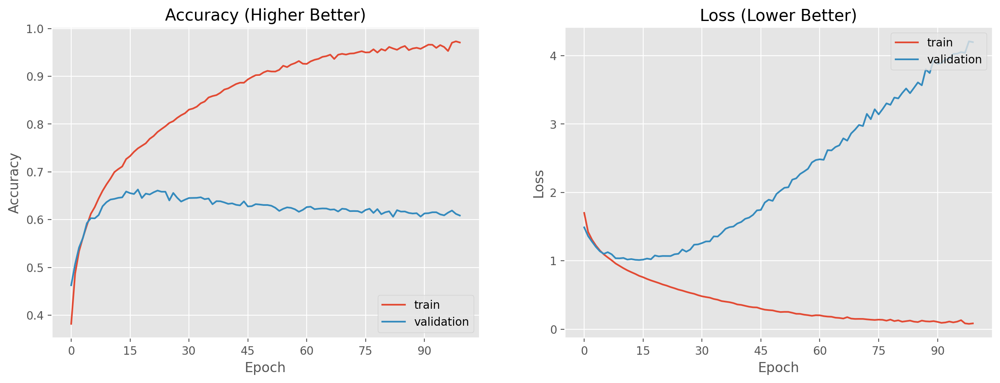

In [17]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [18]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 4ms/step
[3 1 1 ... 5 4 7]


In [19]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [20]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [21]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_20916\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


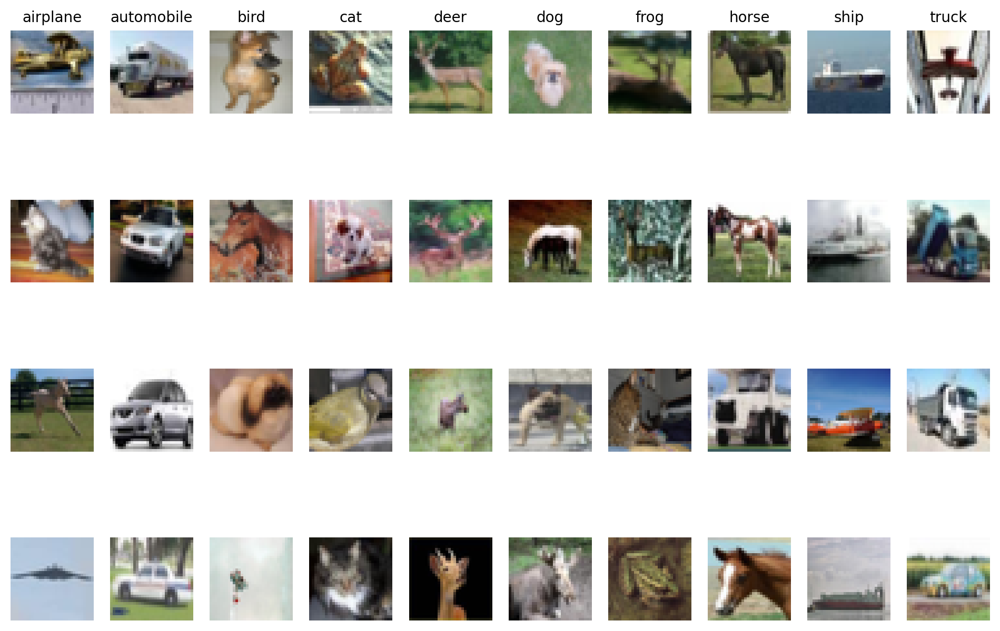

In [22]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 4) - LeNET-5 CNN

### Import

In [13]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [14]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Increased dense layers neurons from 120-240, 84-168

In [15]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_4')
model.add(Conv2D(6, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(16, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu'))
model.add(Dense(168, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 6)         456       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 6)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 16)        2416      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 400)               0         
                                                                 
 dense_6 (Dense)             (None, 240)             

Epoch 47/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1000 - accuracy: 0.9651 - val_loss: 3.4166 - val_accuracy: 0.6082
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0745 - accuracy: 0.9742 - val_loss: 3.4308 - val_accuracy: 0.6024
Epoch 49/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0488 - accuracy: 0.9844 - val_loss: 3.5439 - val_accuracy: 0.6102
Epoch 50/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0659 - accuracy: 0.9774 - val_loss: 3.5688 - val_accuracy: 0.6120
Epoch 51/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0936 - accuracy: 0.9676 - val_loss: 3.6091 - val_accuracy: 0.6024
Epoch 52/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0694 - accuracy: 0.9768 - val_loss: 3.6209 - val_accuracy: 0.6076
Epoch 53/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0657 - accuracy: 0.9769 - val_loss: 3.6441 - val_accuracy:

In [16]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 4ms/step - loss: 5.0522 - accuracy: 0.5964
Test loss:  5.052234172821045
Test accuracy: 0.5964000225067139


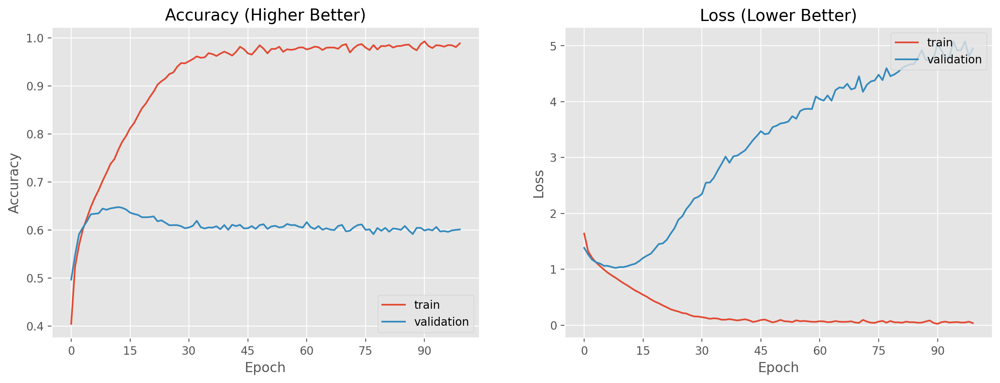

In [17]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [18]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[5 8 1 ... 5 4 7]


In [19]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [20]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [21]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_4092\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


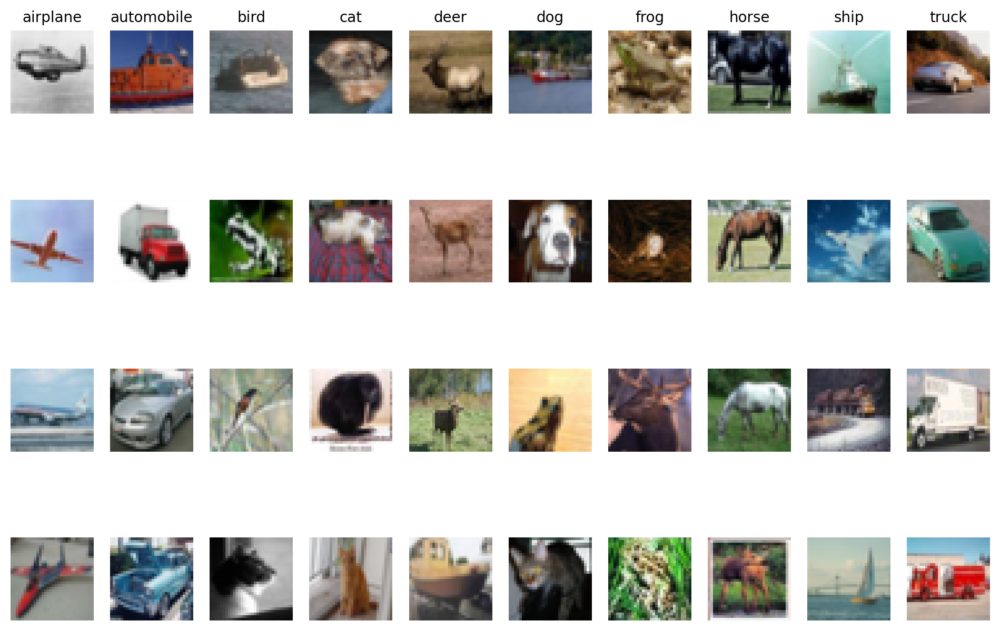

In [22]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 5) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Change activation function to tanh

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_5')
model.add(Conv2D(6, kernel_size=(5, 5), strides=(1, 1), activation='tanh', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(16, kernel_size=(5, 5), strides=(1, 1), activation='tanh'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='tanh'))
model.add(Dense(84, activation='tanh'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 6)         456       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 6)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 16)        2416      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 16)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 400)               0         
                                                                 
 dense (Dense)               (None, 120)             

Epoch 47/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1999 - accuracy: 0.9400 - val_loss: 1.8283 - val_accuracy: 0.6104
Epoch 48/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1897 - accuracy: 0.9435 - val_loss: 1.8747 - val_accuracy: 0.6076
Epoch 49/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1802 - accuracy: 0.9471 - val_loss: 1.9168 - val_accuracy: 0.6060
Epoch 50/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1728 - accuracy: 0.9491 - val_loss: 1.9537 - val_accuracy: 0.6022
Epoch 51/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1714 - accuracy: 0.9494 - val_loss: 1.9931 - val_accuracy: 0.6036
Epoch 52/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1570 - accuracy: 0.9544 - val_loss: 2.0437 - val_accuracy: 0.5954
Epoch 53/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1430 - accuracy: 0.9607 - val_loss: 2.0429 - val_accuracy:

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 3.2987 - accuracy: 0.5738
Test loss:  3.2987051010131836
Test accuracy: 0.5738000273704529


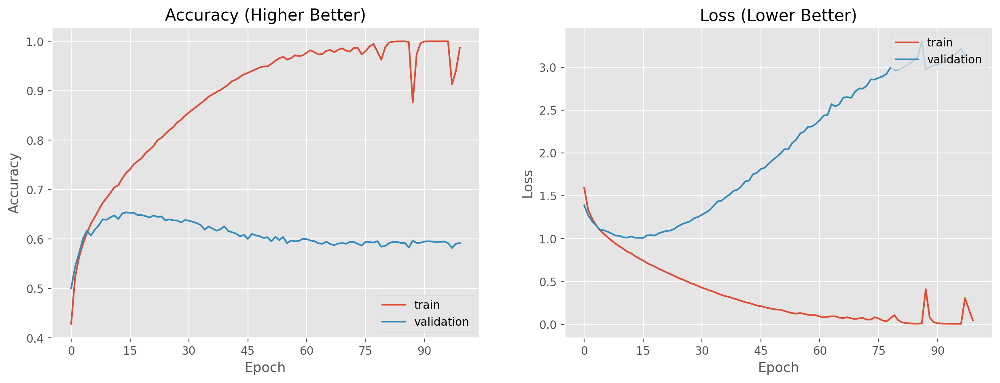

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 1 0 ... 5 3 4]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_28488\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


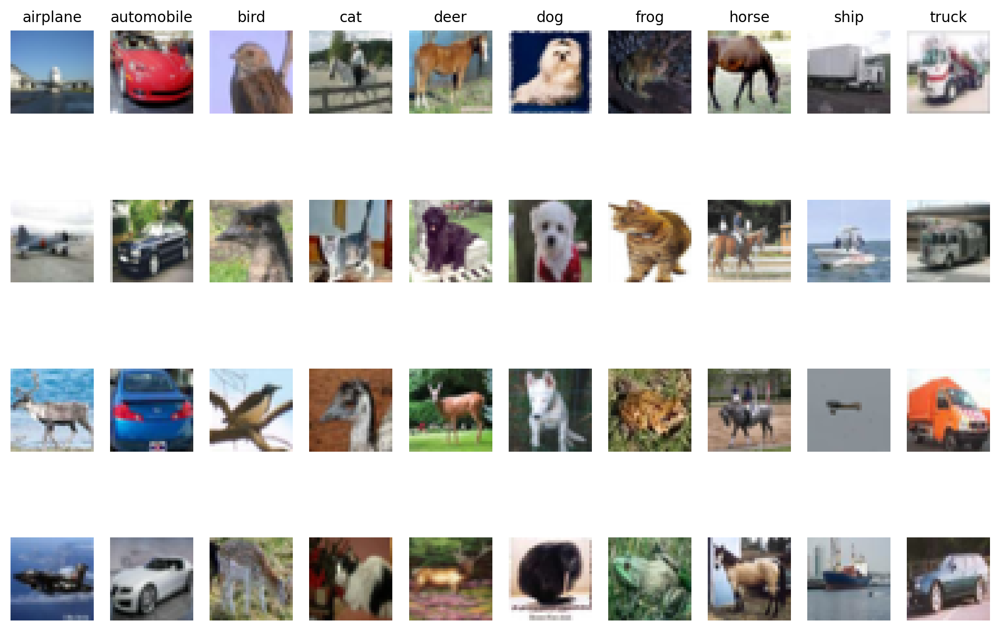

In [11]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 6) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 and 16 to 32

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_6')
model.add(Conv2D(12, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='relu'))
model.add(Dense(84, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 12)        912       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 12)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        9632      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 120)             

Epoch 47/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1108 - accuracy: 0.9606 - val_loss: 2.4810 - val_accuracy: 0.6676
Epoch 48/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0852 - accuracy: 0.9702 - val_loss: 2.6609 - val_accuracy: 0.6724
Epoch 49/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0884 - accuracy: 0.9686 - val_loss: 2.6436 - val_accuracy: 0.6620
Epoch 50/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0840 - accuracy: 0.9698 - val_loss: 2.7427 - val_accuracy: 0.6692
Epoch 51/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0930 - accuracy: 0.9677 - val_loss: 2.8731 - val_accuracy: 0.6624
Epoch 52/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0836 - accuracy: 0.9697 - val_loss: 2.8660 - val_accuracy: 0.6688
Epoch 53/100
352/352 [==============================] - 2s 5ms/step - loss: 0.1023 - accuracy: 0.9642 - val_loss: 2.7956 - val_accuracy:

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 4.4643 - accuracy: 0.6426
Test loss:  4.464289665222168
Test accuracy: 0.6425999999046326


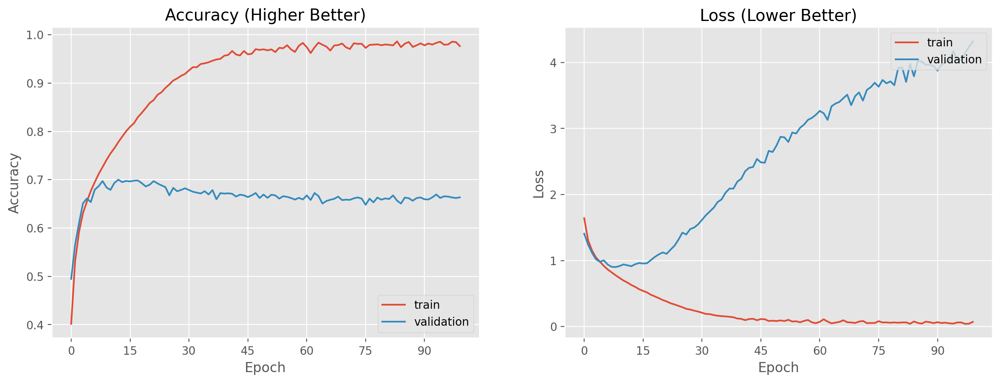

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 1 ... 5 4 7]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_39856\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


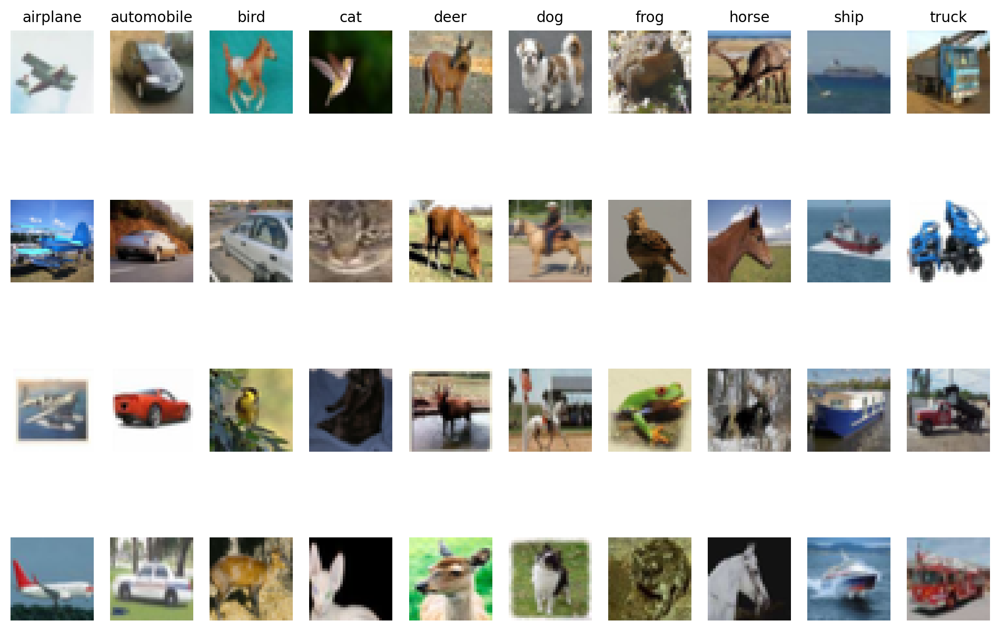

In [11]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 7) - LeNET-5 CNN

### Import

In [12]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [13]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 24 and 16 to 32

In [14]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_7')
model.add(Conv2D(24, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='relu'))
model.add(Dense(84, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 28, 28, 24)        1824      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 24)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 10, 10, 32)        19232     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 800)               0         
                                                                 
 dense_3 (Dense)             (None, 120)             

Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0681 - accuracy: 0.9763 - val_loss: 2.6027 - val_accuracy: 0.6810
Epoch 48/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0814 - accuracy: 0.9734 - val_loss: 2.5790 - val_accuracy: 0.6858
Epoch 49/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0666 - accuracy: 0.9767 - val_loss: 2.5778 - val_accuracy: 0.7008
Epoch 50/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0630 - accuracy: 0.9780 - val_loss: 2.6739 - val_accuracy: 0.6904
Epoch 51/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0790 - accuracy: 0.9728 - val_loss: 2.6368 - val_accuracy: 0.6882
Epoch 52/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0598 - accuracy: 0.9788 - val_loss: 2.7210 - val_accuracy: 0.6946
Epoch 53/100
352/352 [==============================] - 2s 5ms/step - loss: 0.0599 - accuracy: 0.9785 - val_loss: 2.7475 - val_accuracy:

In [15]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 3.9314 - accuracy: 0.6749
Test loss:  3.9313602447509766
Test accuracy: 0.6748999953269958


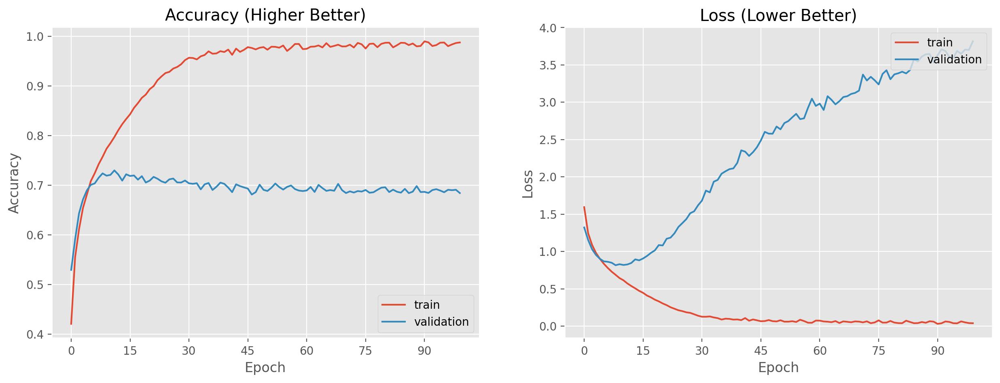

In [16]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [17]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 8 ... 5 4 7]


In [18]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [19]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [20]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_39856\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


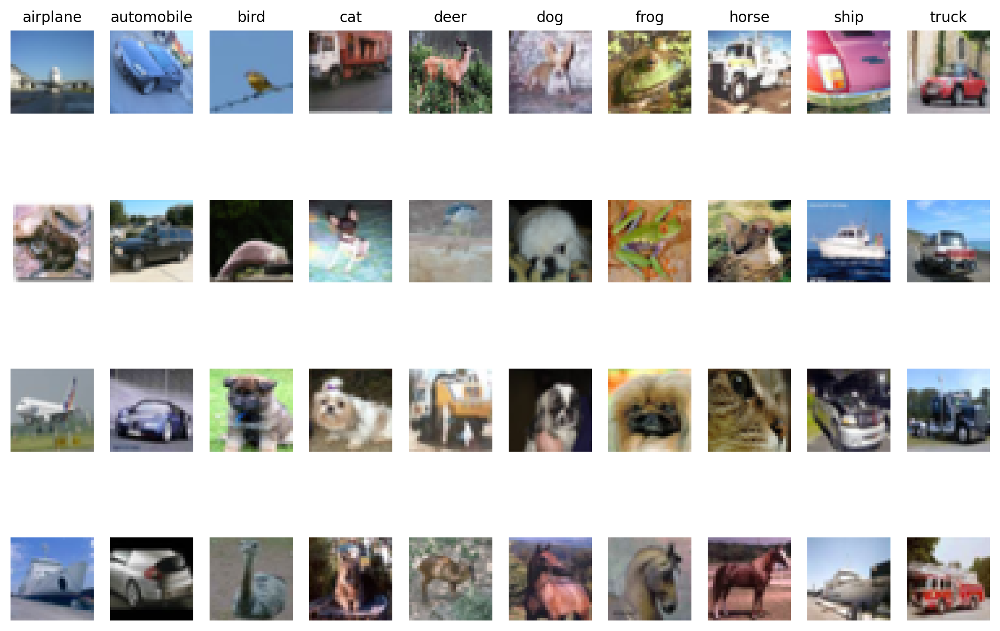

In [21]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 8) - LeNET-5 CNN

### Import

In [22]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [23]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32

In [24]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_8')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(120, activation='relu'))
model.add(Dense(84, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 800)               0         
                                                                 
 dense_6 (Dense)             (None, 120)             

Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0677 - accuracy: 0.9754 - val_loss: 2.5799 - val_accuracy: 0.6926
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0724 - accuracy: 0.9750 - val_loss: 2.6132 - val_accuracy: 0.6886
Epoch 49/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0869 - accuracy: 0.9691 - val_loss: 2.6766 - val_accuracy: 0.6868
Epoch 50/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0772 - accuracy: 0.9732 - val_loss: 2.6480 - val_accuracy: 0.6884
Epoch 51/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0832 - accuracy: 0.9706 - val_loss: 2.6961 - val_accuracy: 0.6852
Epoch 52/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0560 - accuracy: 0.9801 - val_loss: 2.7556 - val_accuracy: 0.6874
Epoch 53/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0565 - accuracy: 0.9805 - val_loss: 2.8767 - val_accuracy:

In [25]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 3.6816 - accuracy: 0.6816
Test loss:  3.681553840637207
Test accuracy: 0.6815999746322632


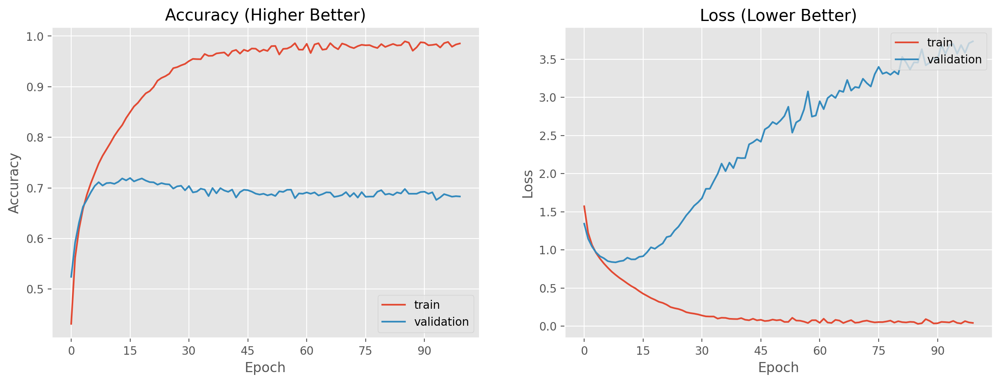

In [26]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [27]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[5 8 8 ... 5 0 7]


In [28]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [29]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [30]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_39856\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


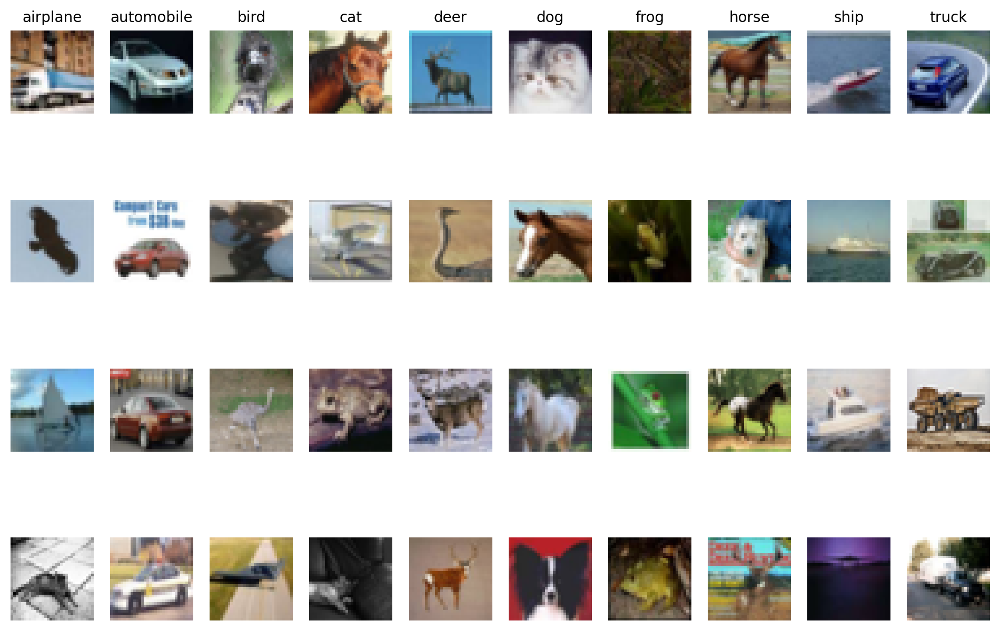

In [31]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 9) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_9')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu'))
# model.add(Dense(268, activation='relu'))
model.add(Dense(168, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)             

Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0405 - accuracy: 0.9867 - val_loss: 2.8498 - val_accuracy: 0.6992
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0504 - accuracy: 0.9834 - val_loss: 2.8357 - val_accuracy: 0.6900
Epoch 49/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0649 - accuracy: 0.9786 - val_loss: 2.7239 - val_accuracy: 0.7020
Epoch 50/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0517 - accuracy: 0.9828 - val_loss: 2.7564 - val_accuracy: 0.6898
Epoch 51/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0367 - accuracy: 0.9880 - val_loss: 3.0099 - val_accuracy: 0.6962
Epoch 52/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0353 - accuracy: 0.9881 - val_loss: 2.9753 - val_accuracy: 0.6992
Epoch 53/100
352/352 [==============================] - 2s 6ms/step - loss: 0.0575 - accuracy: 0.9817 - val_loss: 2.9993 - val_accuracy:

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 3.8631 - accuracy: 0.6867
Test loss:  3.863093376159668
Test accuracy: 0.6866999864578247


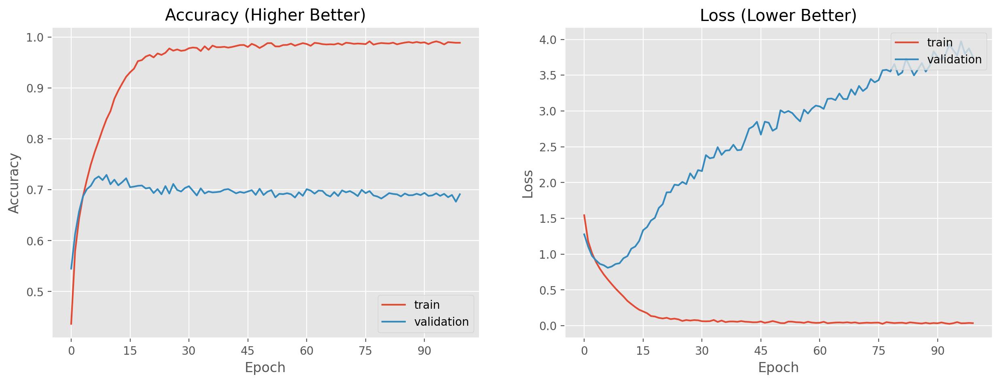

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 8 ... 5 0 7]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_11968\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


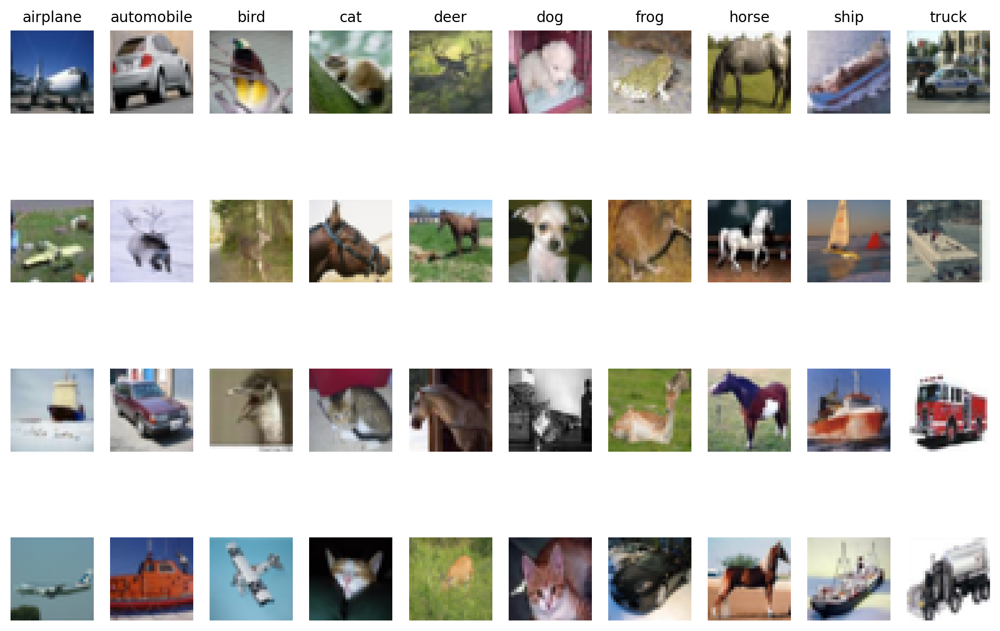

In [11]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 10) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_10')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
# model.add(Dense(268, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)            

Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3710 - accuracy: 0.9516 - val_loss: 1.5887 - val_accuracy: 0.7142
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3839 - accuracy: 0.9472 - val_loss: 1.5232 - val_accuracy: 0.7194
Epoch 49/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3598 - accuracy: 0.9547 - val_loss: 1.5938 - val_accuracy: 0.7108
Epoch 50/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3850 - accuracy: 0.9463 - val_loss: 1.6061 - val_accuracy: 0.7138
Epoch 51/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3731 - accuracy: 0.9514 - val_loss: 1.6768 - val_accuracy: 0.7024
Epoch 52/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3731 - accuracy: 0.9511 - val_loss: 1.6145 - val_accuracy: 0.7138
Epoch 53/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3658 - accuracy: 0.9530 - val_loss: 1.6273 - val_accuracy:

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.7548 - accuracy: 0.7089
Test loss:  1.7547993659973145
Test accuracy: 0.708899974822998


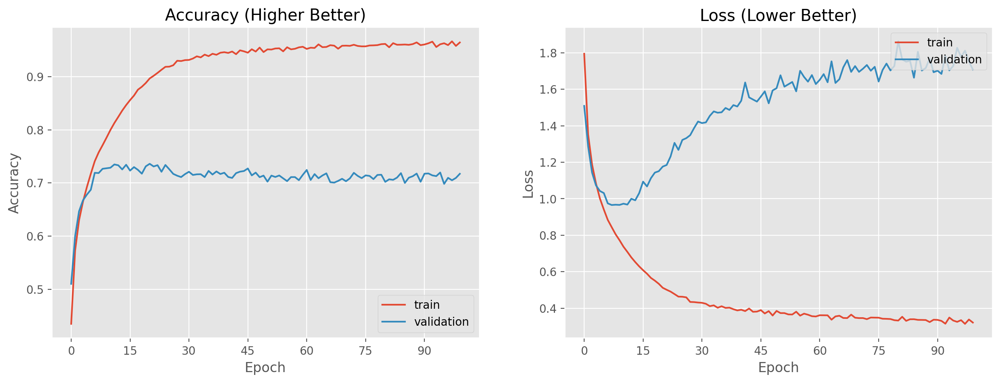

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 8 ... 5 4 7]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_11476\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


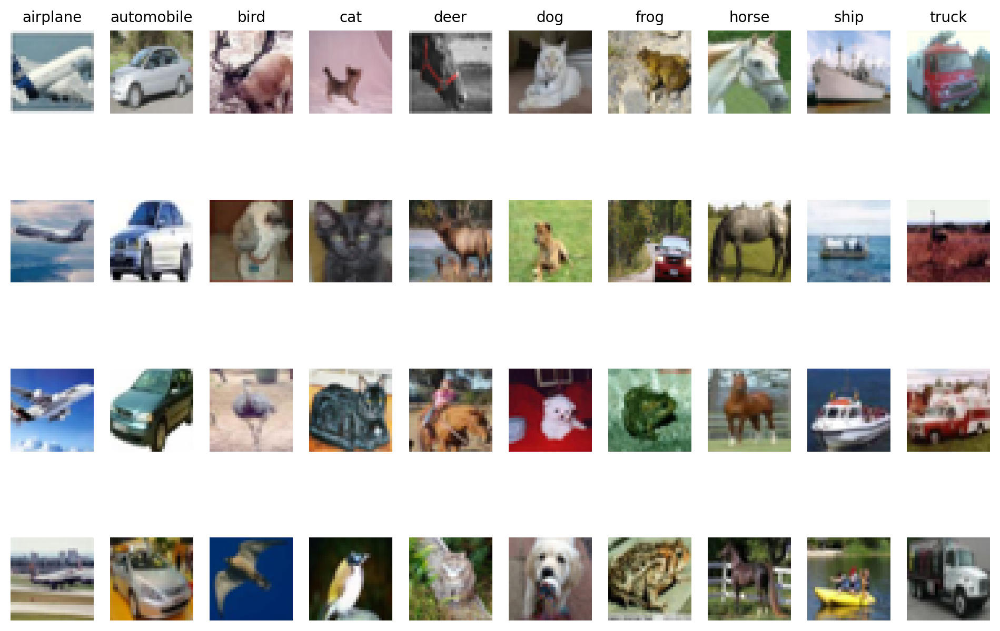

In [11]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 11) - LeNET-5 CNN

### Import

In [12]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [13]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Increased kernel regularizers from 0.001 to 0.0005

In [14]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_11')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.0005)))
# model.add(Dense(268, activation='relu', kernel_regularizer=regularizers.l2(0.0005)))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.0005)))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 800)               0         
                                                                 
 dense_3 (Dense)             (None, 240)            

Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3273 - accuracy: 0.9576 - val_loss: 1.6849 - val_accuracy: 0.7152
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3131 - accuracy: 0.9622 - val_loss: 1.7125 - val_accuracy: 0.7184
Epoch 49/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3059 - accuracy: 0.9651 - val_loss: 1.6997 - val_accuracy: 0.7080
Epoch 50/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3173 - accuracy: 0.9601 - val_loss: 1.8033 - val_accuracy: 0.7030
Epoch 51/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3192 - accuracy: 0.9600 - val_loss: 1.7552 - val_accuracy: 0.7160
Epoch 52/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3129 - accuracy: 0.9623 - val_loss: 1.7525 - val_accuracy: 0.7088
Epoch 53/100
352/352 [==============================] - 2s 6ms/step - loss: 0.3158 - accuracy: 0.9620 - val_loss: 1.7539 - val_accuracy:

In [15]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.9515 - accuracy: 0.6960
Test loss:  1.9515248537063599
Test accuracy: 0.6959999799728394


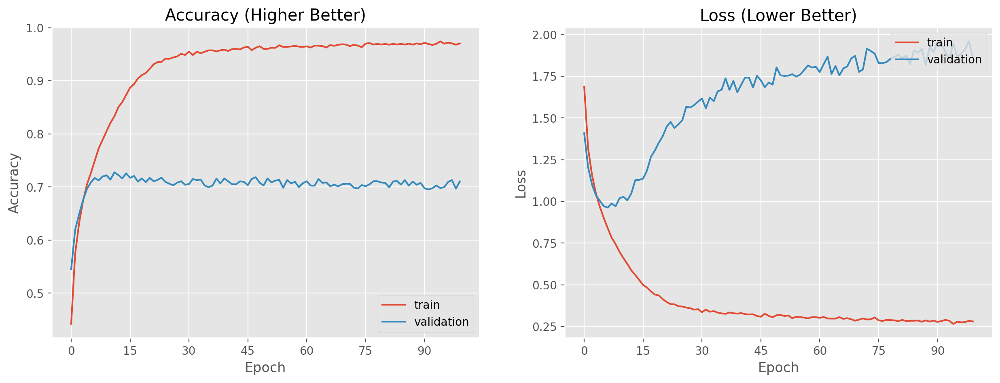

In [16]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [17]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 8 ... 5 1 7]


In [18]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [19]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [20]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_11476\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


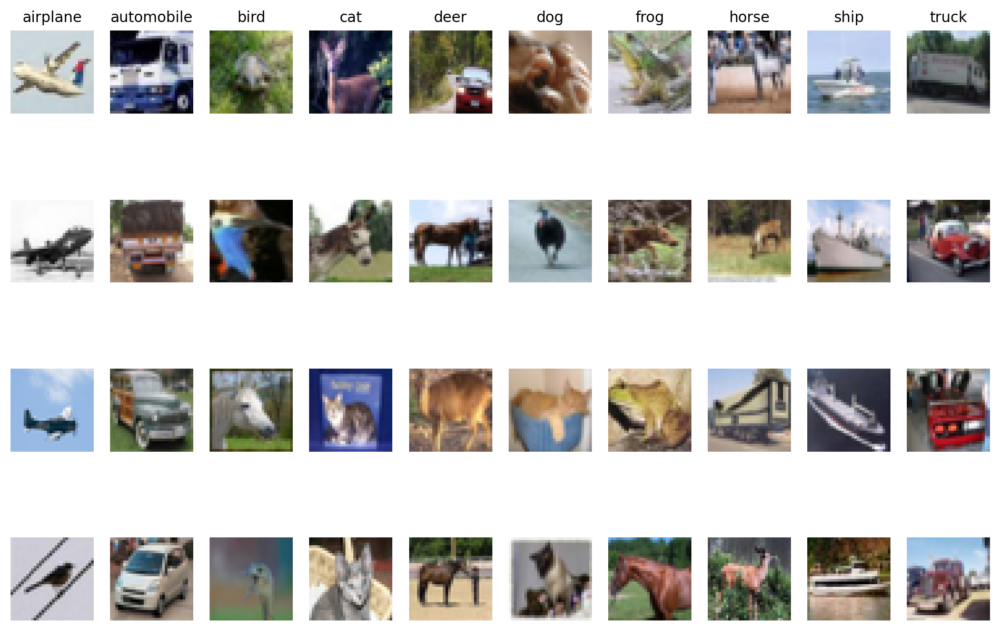

In [21]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 12) - LeNET-5 CNN

### Import

In [22]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [23]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Stuck with kernelregularizers.l2 = 0.001
- Added dropouts in between dense layers

In [24]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_12')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.3))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 800)               0         
                                                                 
 dense_6 (Dense)             (None, 240)            

Epoch 45/100
352/352 [==============================] - 2s 6ms/step - loss: 0.6335 - accuracy: 0.8554 - val_loss: 1.0830 - val_accuracy: 0.7398
Epoch 46/100
352/352 [==============================] - 2s 6ms/step - loss: 0.6329 - accuracy: 0.8533 - val_loss: 1.1245 - val_accuracy: 0.7340
Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.6238 - accuracy: 0.8599 - val_loss: 1.0961 - val_accuracy: 0.7354
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.6259 - accuracy: 0.8579 - val_loss: 1.1050 - val_accuracy: 0.7398
Epoch 49/100
352/352 [==============================] - 2s 6ms/step - loss: 0.6329 - accuracy: 0.8556 - val_loss: 1.1236 - val_accuracy: 0.7382
Epoch 50/100
352/352 [==============================] - 2s 6ms/step - loss: 0.6193 - accuracy: 0.8621 - val_loss: 1.0981 - val_accuracy: 0.7338
Epoch 51/100
352/352 [==============================] - 2s 6ms/step - loss: 0.6164 - accuracy: 0.8630 - val_loss: 1.0920 - val_accuracy:

In [25]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.2375 - accuracy: 0.7257
Test loss:  1.2374658584594727
Test accuracy: 0.7257000207901001


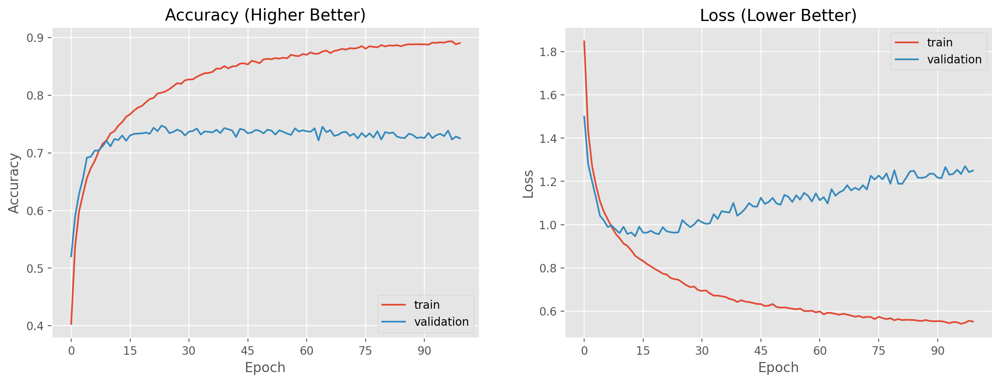

In [26]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [27]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 8 ... 5 1 7]


In [28]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [29]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [30]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_11476\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


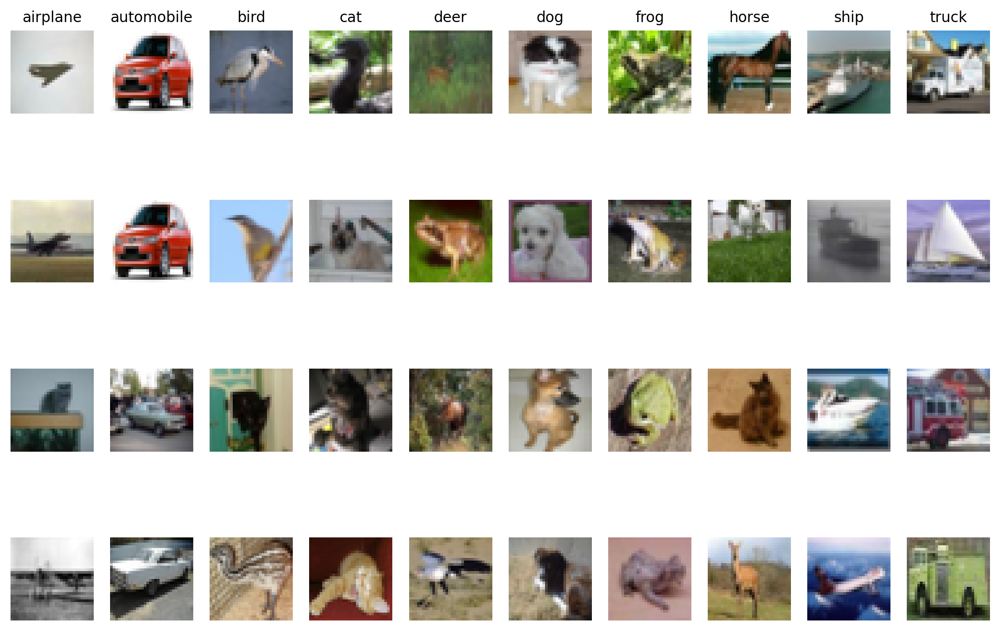

In [31]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 13) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Stuck with kernelregularizers.l2 = 0.001
- Added dropouts in between dense layers
- Changed everything to leakyrelu to test 

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_13')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation=LeakyReLU(), input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation=LeakyReLU()))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation=LeakyReLU(), kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.3))
model.add(Dense(168, activation=LeakyReLU(), kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.2))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)            

352/352 [==============================] - 4s 11ms/step - loss: 0.5822 - accuracy: 0.8606 - val_loss: 1.0924 - val_accuracy: 0.7304


In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 2s 6ms/step - loss: 1.1531 - accuracy: 0.7186
Test loss:  1.1531093120574951
Test accuracy: 0.7185999751091003


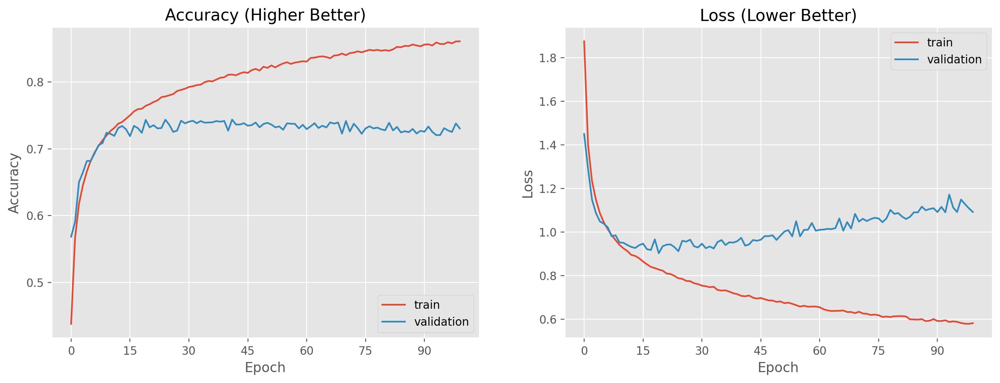

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 2s 4ms/step
[3 8 8 ... 5 4 7]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_13904\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


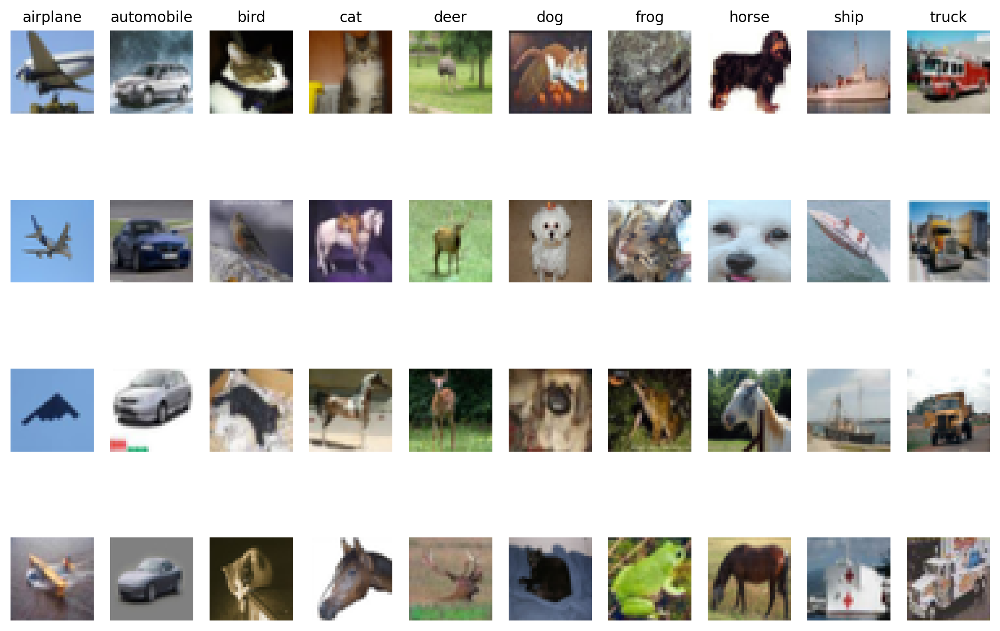

In [11]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 14) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Stuck with kernelregularizers.l2 = 0.001
- Added dropouts in between dense layers
- Increased dropout again 

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_14')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.3))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)            

352/352 [==============================] - 5s 14ms/step - loss: 0.6095 - accuracy: 0.8714 - val_loss: 1.1438 - val_accuracy: 0.7492


In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 2s 7ms/step - loss: 1.1859 - accuracy: 0.7264
Test loss:  1.1858798265457153
Test accuracy: 0.7264000177383423


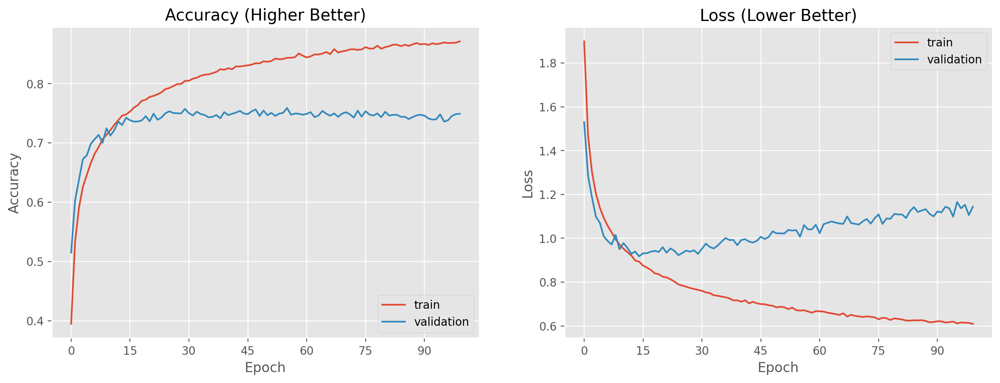

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [27]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 8 ... 5 1 7]


In [28]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [29]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [30]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_11476\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


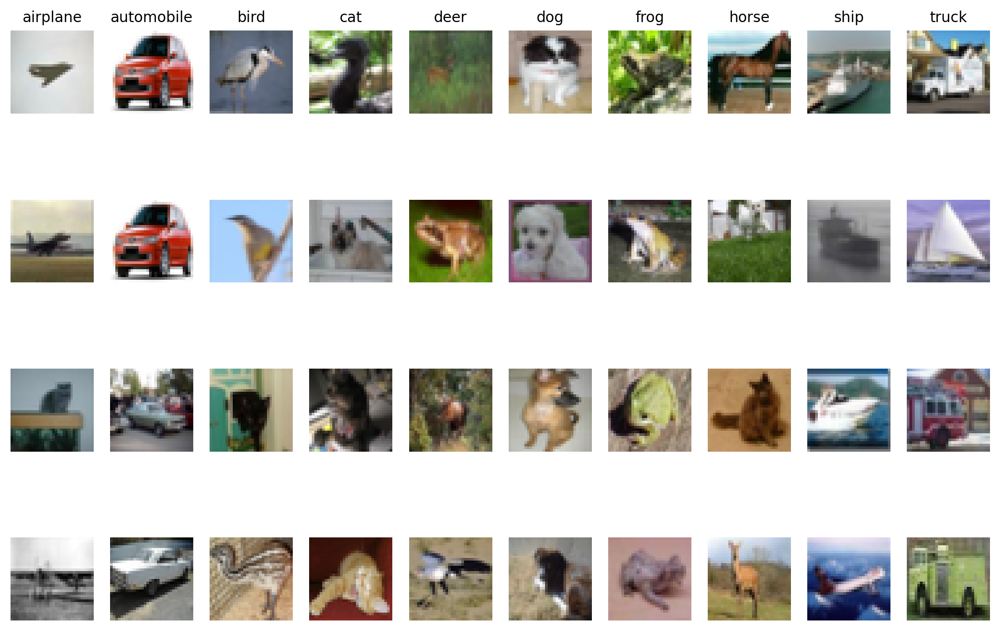

In [31]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 15) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Stuck with kernelregularizers.l2 = 0.001
- Added dropouts in between dense layers
- Increased dropout again x2

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_15')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)            

Epoch 45/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7425 - accuracy: 0.8138 - val_loss: 0.9433 - val_accuracy: 0.7566
Epoch 46/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7389 - accuracy: 0.8170 - val_loss: 0.9765 - val_accuracy: 0.7510
Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7283 - accuracy: 0.8204 - val_loss: 0.9649 - val_accuracy: 0.7516
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7339 - accuracy: 0.8189 - val_loss: 0.9489 - val_accuracy: 0.7610
Epoch 49/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7292 - accuracy: 0.8211 - val_loss: 0.9543 - val_accuracy: 0.7636
Epoch 50/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7220 - accuracy: 0.8219 - val_loss: 0.9504 - val_accuracy: 0.7580
Epoch 51/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7164 - accuracy: 0.8246 - val_loss: 0.9433 - val_accuracy:

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.1097 - accuracy: 0.7363
Test loss:  1.1096594333648682
Test accuracy: 0.736299991607666


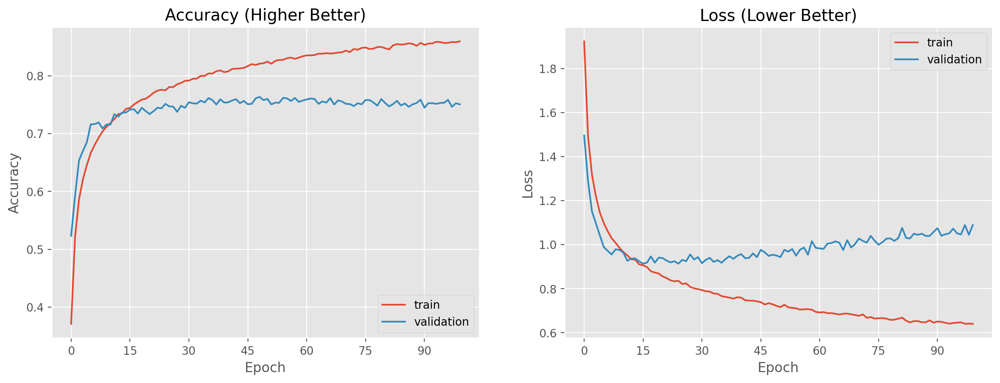

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 8 8 ... 5 1 7]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_29976\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


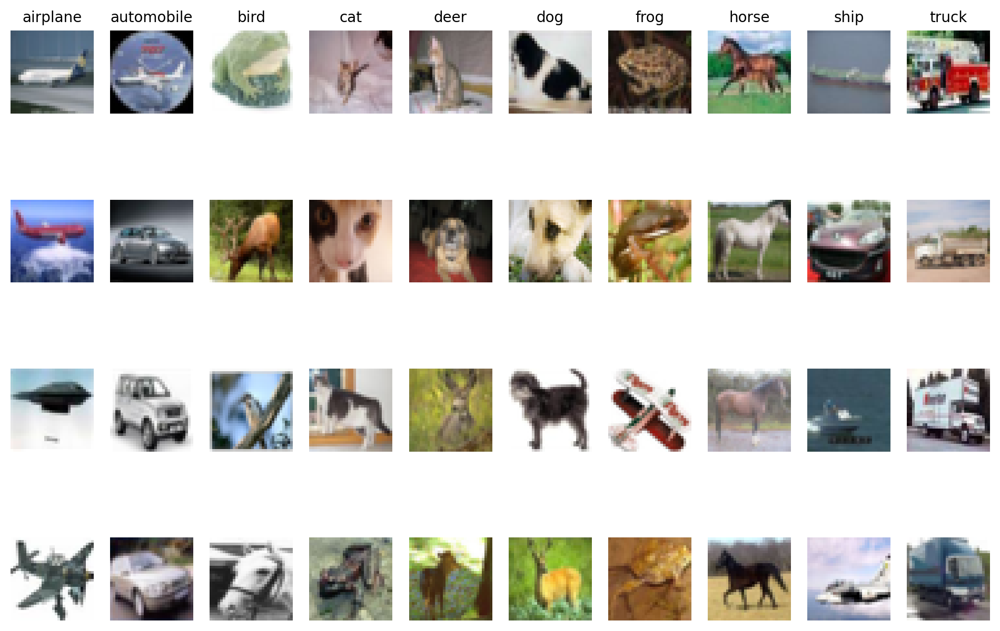

In [11]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 16) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Stuck with kernelregularizers.l2 = 0.001
- Added dropouts in between dense layers
- Increased dropout again x2
- Early Stopper

In [4]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_16')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


# Early Stopper
early_stop = EarlyStopping(monitor='val_accuracy', patience=10)

model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1,
                     callbacks=[early_stop])

    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)            

Epoch 45/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7380 - accuracy: 0.8158 - val_loss: 0.9545 - val_accuracy: 0.7542
Epoch 46/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7361 - accuracy: 0.8197 - val_loss: 0.9615 - val_accuracy: 0.7472
Epoch 47/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7340 - accuracy: 0.8206 - val_loss: 0.9938 - val_accuracy: 0.7476
Epoch 48/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7290 - accuracy: 0.8206 - val_loss: 0.9549 - val_accuracy: 0.7576
Epoch 49/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7318 - accuracy: 0.8197 - val_loss: 0.9578 - val_accuracy: 0.7484
Epoch 50/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7220 - accuracy: 0.8258 - val_loss: 0.9671 - val_accuracy: 0.7516
Epoch 51/100
352/352 [==============================] - 2s 6ms/step - loss: 0.7240 - accuracy: 0.8229 - val_loss: 0.9650 - val_accuracy:

In [5]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 1.0261 - accuracy: 0.7426
Test loss:  1.0261399745941162
Test accuracy: 0.7426000237464905


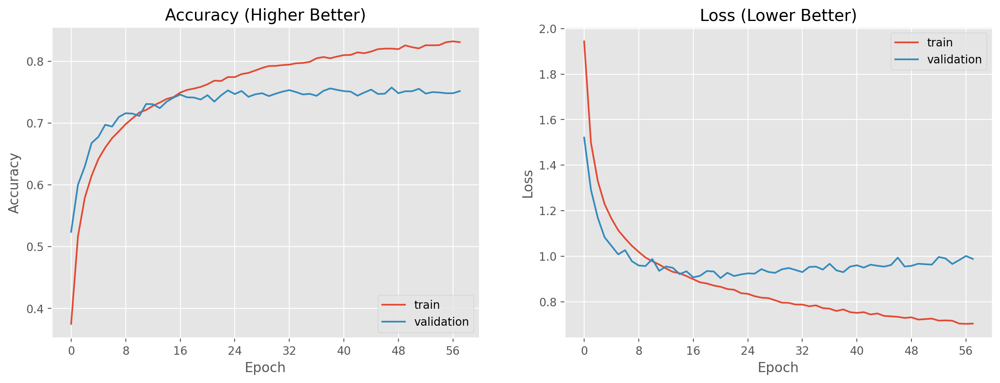

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [7]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[3 1 8 ... 5 1 7]


In [8]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [9]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [10]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_21692\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


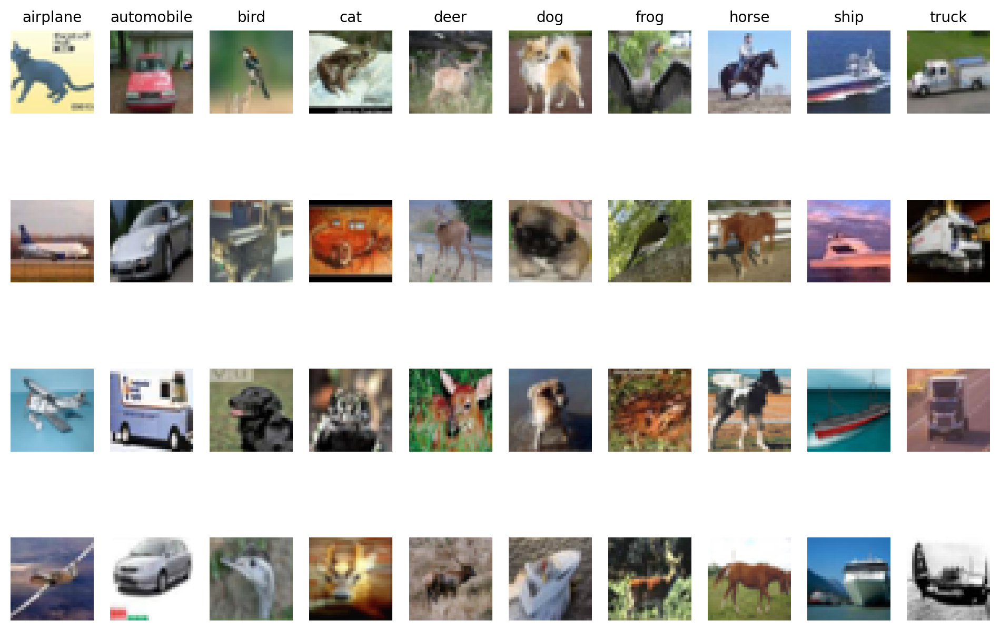

In [11]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 17) - LeNET-5 CNN

### Import

In [2]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [3]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Data augmentation

In [4]:
# set up data augmentation
datagen = ImageDataGenerator(rotation_range=10, 
                             horizontal_flip=True, 
                             width_shift_range=0.1, 
                             height_shift_range=0.1, 
                             validation_split=0.1)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Stuck with kernelregularizers.l2 = 0.001
- Added dropouts in between dense layers
- Increased dropout again x2
- Data augmentation

In [5]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_17')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


# model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)
model_log = model.fit(datagen.flow(X_train, y_train, batch_size=128,
                                   subset='training'),
                     validation_data=datagen.flow(X_train, y_train, batch_size=128, subset='validation'),
                     epochs=100)
    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)            

352/352 [==============================] - 20s 57ms/step - loss: 0.9502 - accuracy: 0.7236 - val_loss: 0.9018 - val_accuracy: 0.7376


In [6]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 4ms/step - loss: 0.8681 - accuracy: 0.7521
Test loss:  0.8681301474571228
Test accuracy: 0.7520999908447266


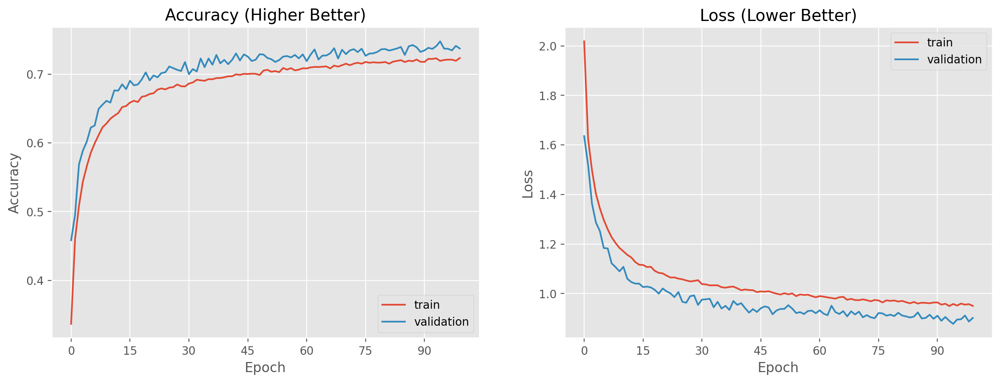

In [7]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [8]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 3ms/step
[3 8 8 ... 5 1 7]


In [9]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [10]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [11]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_26408\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


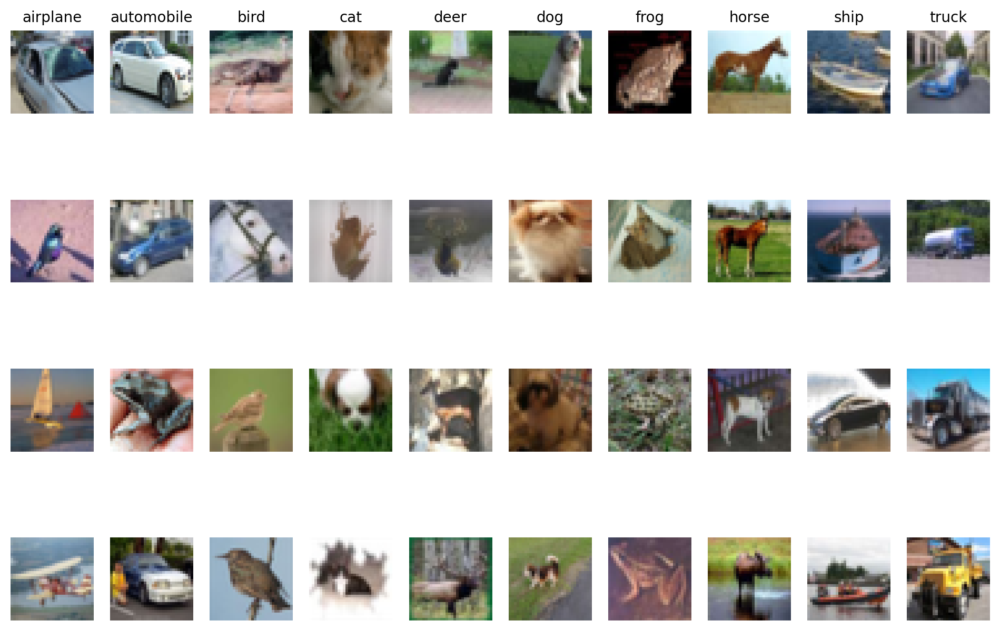

In [12]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Tuned 18) - LeNET-5 CNN

### Import

In [4]:
from keras.datasets import cifar10

# load cifar 10 dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [5]:
# compute mean image 
mean_image = np.mean(X_train, axis=0)

# convert x_train and x_test to float64
X_train = X_train.astype('float64')
X_test = X_test.astype('float64')

# subtract mean image from data
X_train -= mean_image
X_test -= mean_image

# no need to reshape 
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

# normalisation 
X_train /= 255
X_test /= 255

# convert to categorical before running model
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

### Data augmentation

In [6]:
# set up data augmentation
datagen = ImageDataGenerator(rotation_range=10, 
                             horizontal_flip=True, 
                             width_shift_range=0.1, 
                             height_shift_range=0.1, 
                             validation_split=0.1)

### Build neural network
### <font color=purple>Changes Made</font> 
- Added mean subtraction for data preprocessing
- Changed validation data to validation split 0.1
- Changed batch size from 256 to 128 in attempt to prevent overfitting
- Double filter from 6 to 12 to 32 and 16 to 32
- Doubled neurons in fully connected layers
- Add kernel regularizers into dense layers 
- Stuck with kernelregularizers.l2 = 0.001
- Added dropouts in between dense layers
- Increased dropout again x2
- Data augmentation
- Add learning rate scheduler

In [7]:
# build LeNet5 model     
model = Sequential(name='LeNET_Tuned_17')
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Flatten())
model.add(Dense(240, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.5))
model.add(Dense(168, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

# define learning rate scheduler 
lr_scheduler = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.0001)


# model_log = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.1)
model_log = model.fit(datagen.flow(X_train, y_train, batch_size=128,
                                   subset='training'),
                     validation_data=datagen.flow(X_train, y_train, batch_size=128, subset='validation'),
                     epochs=100, callbacks=[lr_scheduler])
    
# LeNet5(X_train, y_train, y_test)
    

Model: "LeNET_Tuned_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 10, 10, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 32)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 800)               0         
                                                                 
 dense (Dense)               (None, 240)            

352/352 [==============================] - 14s 39ms/step - loss: 0.7855 - accuracy: 0.7515 - val_loss: 0.7585 - val_accuracy: 0.7574 - lr: 1.0000e-04
Epoch 91/100
352/352 [==============================] - 14s 39ms/step - loss: 0.7908 - accuracy: 0.7516 - val_loss: 0.7507 - val_accuracy: 0.7626 - lr: 1.0000e-04
Epoch 92/100
352/352 [==============================] - 14s 39ms/step - loss: 0.7842 - accuracy: 0.7525 - val_loss: 0.7467 - val_accuracy: 0.7700 - lr: 1.0000e-04
Epoch 93/100
352/352 [==============================] - 14s 39ms/step - loss: 0.7831 - accuracy: 0.7520 - val_loss: 0.7414 - val_accuracy: 0.7672 - lr: 1.0000e-04
Epoch 94/100
352/352 [==============================] - 14s 39ms/step - loss: 0.7816 - accuracy: 0.7545 - val_loss: 0.7449 - val_accuracy: 0.7610 - lr: 1.0000e-04
Epoch 95/100
352/352 [==============================] - 14s 39ms/step - loss: 0.7883 - accuracy: 0.7522 - val_loss: 0.7420 - val_accuracy: 0.7638 - lr: 1.0000e-04
Epoch 96/100
352/352 [=============

In [8]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 0.7400 - accuracy: 0.7640
Test loss:  0.7400107979774475
Test accuracy: 0.7639999985694885


- When training the neural network, we are given the training loss, training accuracy, validation loss and validation accuracy. When we compile our model, we are able to split the training set even more into 70% and 10% for validation using the code validation_split=0.3 where we can leave 30% of the training split for validation during our model buildin (validation split can vary depending on code input)

- However, when we train our model, the validation accuracy itself may not indicate any form of overfitting in our model where our training set performs well (high accuracy) and our validation set performs poorly (low accuracy). The validation accuracy give us a better indication whether our model has overfitted or not (where the training accuracy is high and the validation accuracy is low). Using the validation accuracy we are able to gauge whether our model by comparing the accuracies between the training set and the validation set. 

- Early stopping can be considered when our model has hit a plateau where the validation_loss has hit a plateau or when the validation accuracy has hit a plateau. What this means is that when the validation loss is no longer decreasing and the validation accuracy is no longer increasing. However this can be changed by setting the early_stopping parameters in the callbacks within the model.compile() line of code. 

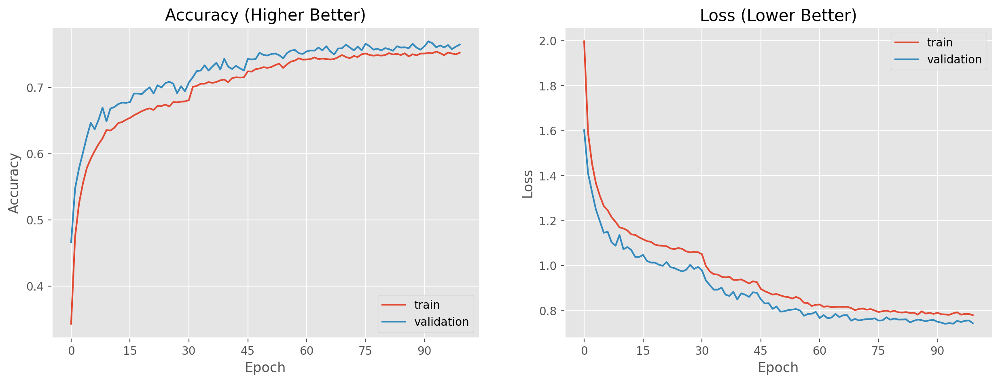

In [9]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [10]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 1ms/step
[3 1 8 ... 5 1 7]


In [11]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [12]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [13]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_24644\3749317389.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


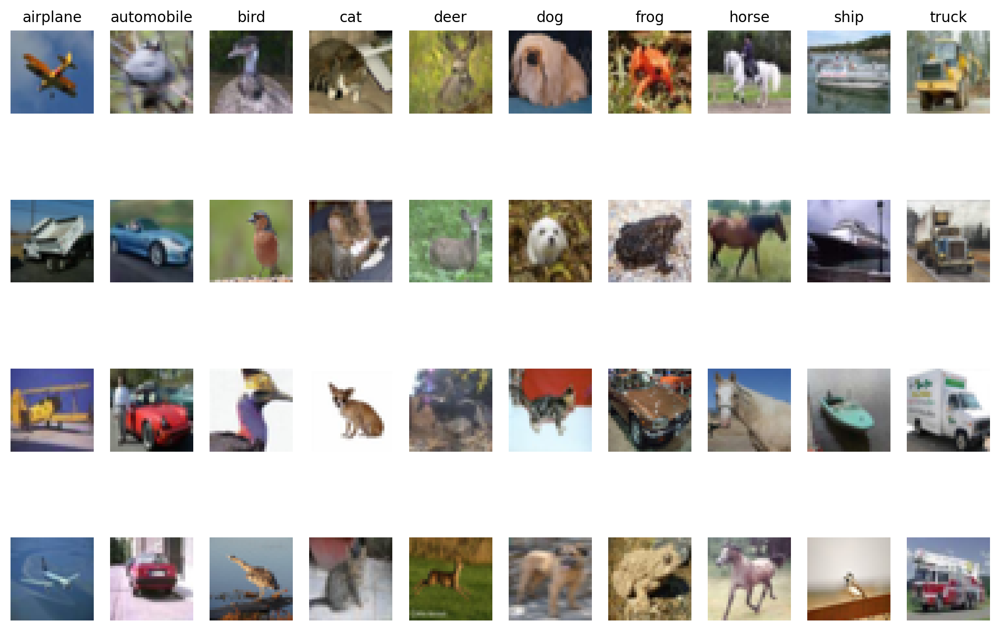

In [14]:
num_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

# <font color= maroon> Model Building (Baseline) - Inception-V3 

### What is Inception V3?
- Inception v3 is a neural network developed by google that was built upon the original basic model of Inception V1 aka GoogLeNet in 2014. 

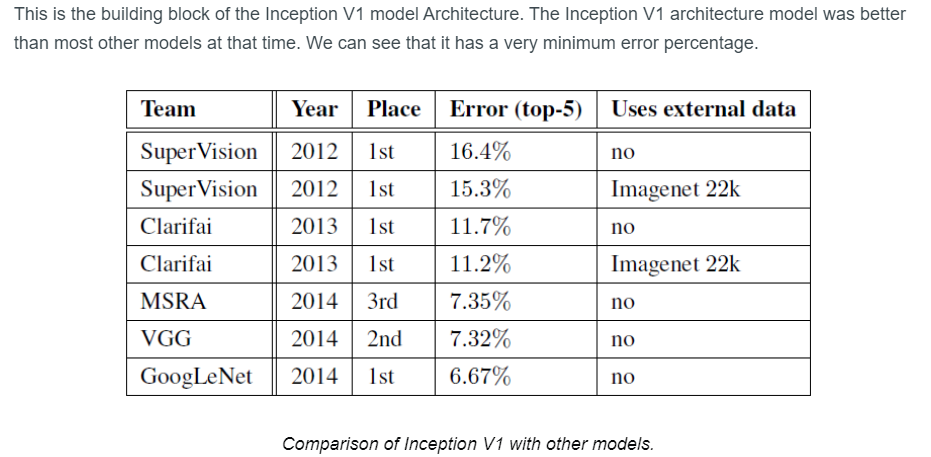

T, A. N. (2021). Inception V3 Model Architecture. OpenGenus IQ: Computing Expertise & Legacy. https://iq.opengenus.org/inception-v3-model-architecture/

- Amongst all other competitors, GoogLeNet Inception has performed significantly better with the least amount of error. Furthermore, one of the advantages it has over the native inception V1 is that it is significantly less computationally expensive, less time consuming and does not require high computational power. 

- How is this achieved: Authors of this neural network designed an architecture that makes use of a 1 by 1 convolutional layer which "results in reduced dimensions of the network and faster computations."

### What makes Inception V3 better?
- Higher Efficiency
- Deeper network as compared to V1 & V2
- Uses auxillary Classifiers as regularisers 
- Smaller model size
- Better use of pre-processing

### Import

In [6]:
from keras.datasets import cifar10

# load cifar 10 dataset
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

### Data Preprocessing

In [7]:
# # normalise pixel values between 0 and 1
# x_train = x_train.astype('float32')/255.0
# x_test = x_test.astype('float32')/255.0

# y_train = to_categorical(y_train)
# y_test = to_categorical(y_test)


# # # Resize the images to the required size
# # x_train = tf.image.resize(x_train, size=(75, 75))
# # x_test = tf.image.resize(x_test, size=(75, 75))


# compute mean image
mean_image = np.mean(x_train, axis=0)

# normalise pixle values
x_train = x_train.astype('float32')/255.0
x_test = x_test.astype('float32')/255.0

# subtract mean image from data
x_train -= mean_image
x_test -= mean_image

x_train = tf.image.resize(x_train, size=(224, 224))
x_test = tf.image.resize(x_test, size=(224, 224))


y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

ResourceExhaustedError: {{function_node __wrapped__ResizeBilinear_device_/job:localhost/replica:0/task:0/device:GPU:0}} OOM when allocating tensor with shape[50000,224,224,3] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:ResizeBilinear]

### Build neural network

In [26]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, keras.utils.to_categorical(y_test))
print('Test loss: ', test_loss)
print('Test accuracy:', test_acc)

313/313 [==============================] - 1s 3ms/step - loss: 302.1728 - accuracy: 0.4676
Test loss:  302.17279052734375
Test accuracy: 0.4675999879837036


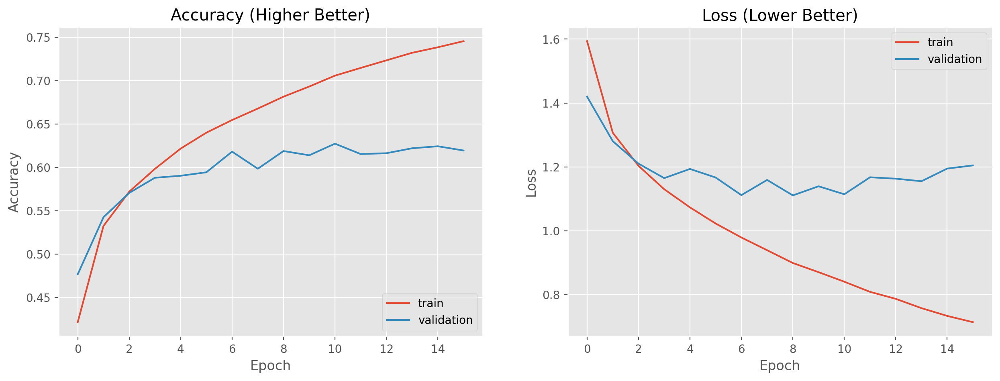

In [27]:
f, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

ax1.plot(model_log.history['accuracy'])
ax1.plot(model_log.history['val_accuracy'])
ax1.set_title('Accuracy (Higher Better)')
ax1.set(xlabel='Epoch', ylabel='Accuracy')
ax1.legend(['train', 'validation'], loc='lower right')
ax1.xaxis.set_major_locator(MaxNLocator(integer=True))

ax2.plot(model_log.history['loss'])
ax2.plot(model_log.history['val_loss'])
ax2.set_title('Loss (Lower Better)')
ax2.set(xlabel='Epoch', ylabel='Loss')
ax2.legend(['train', 'validation'], loc='upper right')
ax2.xaxis.set_major_locator(MaxNLocator(integer=True))

In [28]:
predict_x = model.predict(X_test) 
output = np.argmax(predict_x,axis=1)
print(output)

313/313 [==============================] - 1s 2ms/step
[5 9 0 ... 5 1 7]


In [29]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
ind = np.where(np.equal(output, y_test)==0)

In [30]:
# Select a random subset of wrongly classified images
subset_size = 1000
ind_subset = np.random.choice(ind[0], size=subset_size, replace=False)

err_x = X_test[ind_subset]
err_y = output[ind_subset]

In [31]:
print (err_x.shape)

(1000, 32, 32, 3)


C:\Users\mctro\AppData\Local\Temp\ipykernel_27760\1182170958.py:9: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)


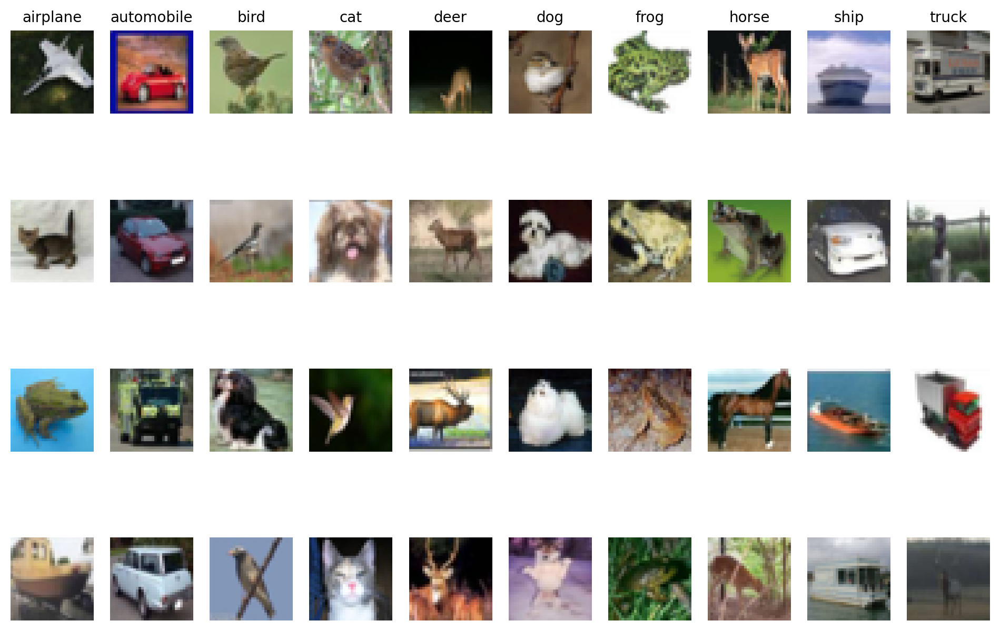

In [33]:
# visualise some wrongly classified images
examples_per_class = 4
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12, 8))
for cls, cls_name in enumerate(num_classes):
    idxs = np.where(cls == err_y)
    idxs = np.random.choice(idxs[0], examples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(num_classes), i * len(num_classes) + cls + 1)
        plt.imshow(err_x[idx].astype('uint8'), cmap = 'gray')
        plt.axis('off')
        if i == 0:
            plt.title(cls_name, fontsize=10)

### References
- This tech report (Chapter 3) describes the dataset and the methodology followed when collecting it in much greater detail. Please cite it if you intend to use this dataset.
- https://blog.paperspace.com/tensorflow-callbacks/

# <font color= maroon> TEST

In [ ]:
import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import LearningRateScheduler
from keras.utils import to_categorical

# Step 1: Preprocess the data
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255
mean = x_train.mean(axis=(0,1,2))
std = x_train.std(axis=(0,1,2))
x_train = (x_train - mean) / (std + 1e-7)
x_test = (x_test - mean) / (std + 1e-7)
datagen = ImageDataGenerator(
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
)
datagen.fit(x_train)

# Step 2: Choose a neural network architecture
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', input_shape=x_train.shape[1:]))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))
model.add(Conv2D(128, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(128, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Conv2D(256, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(256, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(256, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))
model.add(Conv2D(512, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(512, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Conv2D(512, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(512))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(10))
model.add(Activation('softmax'))

# Step 3: Define the loss function and optimizer
sgd = SGD(lr=0.1, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

# Step 4: Train the model
def lr_schedule(epoch):
    lr = 0.1
    if epoch > 80:
        lr *= 0.5e-3
    elif epoch > 60:
        lr *= 1e-3
    elif epoch > 40:
        lr *= 1e-2
    elif epoch > 20:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr

lr_scheduler = LearningRateScheduler(lr_schedule)

#Just added this part
y_train = to_categorical(y_train, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

model.fit(datagen.flow(x_train, y_train, batch_size=128), 
          epochs=100, 
          validation_data=(x_test, y_test), 
          callbacks=[lr_scheduler])

# Step 5: Evaluate the model
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


# VGG 2

In [2]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

IMG_SIZE = 224

def format_image(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    # Normalization
    image = image / 255.0
    return image, label

batch_size = 64

# Create TensorFlow dataset objects for the training and test sets
train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test))

# Preprocess, batch, and prefetch the datasets
training_set = train_ds.shuffle(300).map(format_image).batch(batch_size).prefetch(1)
test_set = test_ds.map(format_image).batch(batch_size).prefetch(1)

# Load the pre-trained VGG16 model
# pretrained_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights = 'imagenet')
vgg_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the VGG16 model
vgg_model.trainable = False

# Create a new model that includes the VGG16 model and additional layers
model = Sequential()
model.add(vgg_model)
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(tf.keras.layers.Dense(10, activation='softmax'))

model.summary()

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

EPOCHS = 50

history = model.fit(
    training_set,
    epochs=EPOCHS,
    validation_data=test_set
)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 512)               12845568  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 10)                5130      
                                                                 
Total params: 27,565,386
Trainable params: 12,850,698
Non-trainable params: 14,714,688
_________________________________________________________________
Epoch 1/50


C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\backend.py:5582: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


ResourceExhaustedError: Graph execution error:

Detected at node 'sequential/vgg16/block1_conv2/Relu' defined at (most recent call last):
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
      app.start()
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel\kernelapp.py", line 711, in start
      self.io_loop.start()
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\asyncio\base_events.py", line 601, in run_forever
      self._run_once()
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\asyncio\base_events.py", line 1905, in _run_once
      handle._run()
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
      await result
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel\kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel\ipkernel.py", line 411, in do_execute
      res = shell.run_cell(
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\ipykernel\zmqshell.py", line 531, in run_cell
      return super().run_cell(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\IPython\core\interactiveshell.py", line 3006, in run_cell
      result = self._run_cell(
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\IPython\core\interactiveshell.py", line 3061, in _run_cell
      result = runner(coro)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\IPython\core\interactiveshell.py", line 3266, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\IPython\core\interactiveshell.py", line 3445, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\mctro\AppData\Local\Temp\ipykernel_11440\3234875112.py", line 48, in <module>
      history = model.fit(
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\training.py", line 1146, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\training.py", line 1135, in run_step
      outputs = model.train_step(data)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\training.py", line 993, in train_step
      y_pred = self(x, training=True)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\sequential.py", line 410, in call
      return super().call(inputs, training=training, mask=mask)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\layers\convolutional\base_conv.py", line 314, in call
      return self.activation(outputs)
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\activations.py", line 317, in relu
      return backend.relu(
    File "C:\Users\mctro\anaconda3\envs\tf2\lib\site-packages\keras\backend.py", line 5366, in relu
      x = tf.nn.relu(x)
Node: 'sequential/vgg16/block1_conv2/Relu'
OOM when allocating tensor with shape[64,64,224,224] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node sequential/vgg16/block1_conv2/Relu}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_1496]

# VGG 3

In [5]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Resize the images to 224x224
x_train = tf.image.resize(x_train, (224, 224))
x_test = tf.image.resize(x_test, (224, 224))

x_train = preprocess_input(x_train)
x_test = preprocess_input(x_test)

y_train = keras.utils.np_utils.to_categorical(y_train, num_classes)
y_test = keras.utils.np_utils.to_categorical(y_test, num_classes)

# Load the pre-trained VGG16 model
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the VGG16 model
for layer in vgg_model.layers:
    layer.trainable = False

# Create a new model that includes the VGG16 model and additional layers
model = Sequential()
model.add(vgg_model)
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(tf.keras.layers.Dense(10, activation='softmax'))

model.compile(
    optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"]
)

model_log = model.fit(x_train, y_train, batch_size=128, epochs=50, validation_split=0.1)


ResourceExhaustedError: {{function_node __wrapped__ResizeBilinear_device_/job:localhost/replica:0/task:0/device:CPU:0}} OOM when allocating tensor with shape[50000,224,224,3] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator cpu [Op:ResizeBilinear]